# UMAPs Neurips samples, NK cells

Surface markers + respective RNA

- CLR normalized data

### Reference 1: #

R-code offered by Mustjoki group
    
### Reference 2: #

Pfefferle, A., Netskar, H., Ask, E. H., Lorenz, S., Goodridge, J. P., Sohlberg, E., Clancy, T., & Malmberg, K.-J. (2019). A Temporal Transcriptional Map of Human Natural Killer Cell Differentiation. BioRxiv, 630657. https://doi.org/10.1101/630657


### Reference 3: #

Melsen, J. E., van Ostaijen-Ten Dam, M. M., Schoorl, D. J. A., Schol, P. J., van den Homberg, D. A. L., Lankester, A. C., Lugthart, G., & Schilham, M. W. (2022). Single-cell transcriptomics in bone marrow delineates CD56dimGranzymeK+ subset as intermediate stage in NK cell differentiation. Frontiers in immunology, 13, 1044398. https://doi.org/10.3389/fimmu.2022.1044398

### Reference 4: #

Yang, C., Siebert, J. R., Burns, R., Gerbec, Z. J., Bonacci, B., Rymaszewski, A., Rau, M., Riese, M. J., Rao, S., Carlson, K. S., Routes, J. M., Verbsky, J. W., Thakar, M. S., & Malarkannan, S. (2019). Heterogeneity of human bone marrow and blood natural killer cells defined by single-cell transcriptome. Nature communications, 10(1), 3931. https://doi.org/10.1038/s41467-019-11947-7


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
#Neurips
adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [3]:
#To find gene names

result = [i for i in adata_neurips.var_names if i.startswith('TC')]
print(result)

['TC2N', 'TCAF1', 'TCAF2', 'TCAIM', 'TCAP', 'TCEA1', 'TCEA2', 'TCEA3', 'TCEAL1', 'TCEAL2', 'TCEAL3', 'TCEAL4', 'TCEAL5', 'TCEAL7', 'TCEAL8', 'TCEAL9', 'TCEANC', 'TCEANC2', 'TCEB1', 'TCEB2', 'TCEB3', 'TCEB3-AS1', 'TCERG1', 'TCF12', 'TCF15', 'TCF19', 'TCF20', 'TCF23', 'TCF25', 'TCF3', 'TCF4', 'TCF4-AS2', 'TCF7', 'TCF7L1', 'TCF7L2', 'TCFL5', 'TCHH', 'TCHP', 'TCIRG1', 'TCL1A', 'TCL1B', 'TCL6', 'TCN2', 'TCOF1', 'TCP1', 'TCP10L', 'TCP11', 'TCP11L1', 'TCP11L2', 'TCTA', 'TCTE1', 'TCTE3', 'TCTEX1D1', 'TCTEX1D2', 'TCTEX1D4', 'TCTN1', 'TCTN2', 'TCTN3']


In [4]:
adata_neurips.obs['cell_type'].unique().tolist()

['NK',
 'CD8+ T CD69+ CD45RA+',
 'NK CD158e1+',
 'HSC',
 'CD14+ Mono',
 'B1 B IGKC+',
 'CD4+ T activated',
 'CD8+ T CD69+ CD45RO+',
 'G/M prog',
 'Naive CD20+ B IGKC-',
 'CD8+ T CD49f+',
 'Naive CD20+ B IGKC+',
 'CD4+ T naive',
 'CD8+ T naive',
 'CD4+ T activated integrinB7+',
 'cDC2',
 'gdT TCRVD2+',
 'CD8+ T TIGIT+ CD45RO+',
 'CD16+ Mono',
 'Erythroblast',
 'MAIT',
 'T reg',
 'gdT CD158b+',
 'Transitional B',
 'Proerythroblast',
 'CD8+ T CD57+ CD45RO+',
 'Plasmablast IGKC+',
 'ILC1',
 'Lymph prog',
 'ILC',
 'MK/E prog',
 'Normoblast',
 'CD8+ T CD57+ CD45RA+',
 'pDC',
 'B1 B IGKC-',
 'Plasma cell IGKC-',
 'Plasmablast IGKC-',
 'Plasma cell IGKC+',
 'CD8+ T TIGIT+ CD45RA+',
 'CD8+ T naive CD127+ CD26- CD101-',
 'CD4+ T CD314+ CD45RA+',
 'cDC1',
 'T prog cycling',
 'dnT']

In [5]:
#Both NK cell types selected


neurips_nk = adata_neurips[(adata_neurips.obs['cell_type'] == "NK") | (adata_neurips.obs['cell_type'] == "NK CD158e1+")]

In [6]:
neurips_nk

View of AnnData object with n_obs × n_vars = 7388 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [7]:
neurips_nk_prot=neurips_nk.obsm['protein_expression_clr_neurips']

In [8]:
#To exclude columns that contain only zeros

neurips_nk_prot = pd.DataFrame(neurips_nk_prot)
neurips_nk_prot != 0
(neurips_nk_prot != 0).any(axis=0)
neurips_nk_prot.loc[:, (neurips_nk_prot != 0).any(axis=0)]
neurips_nk_prot = neurips_nk_prot.loc[:, (neurips_nk_prot != 0).any(axis=0)]

In [9]:
samples=adata_neurips.obs['POOL'].unique().tolist()

In [10]:
#selecting one sample from Neurips

eg=adata_neurips[adata_neurips.obs['POOL'] == "s1d2"]


In [11]:
eg

View of AnnData object with n_obs × n_vars = 4450 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [12]:
prot=eg.obsm['protein_expression_clr_neurips']

In [13]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
CTCCCTCAGCCGATTT-1-s1d2,3.633018,0.324031,0.239901,1.599031,0.973150,1.161496,1.658263,0.512721,0.254617,0.223816,...,0.519175,0.866887,1.081261,0.605141,1.112478,0.0,0.0,0.0,0.0,0.0
AAAGAACCAAGTCATC-1-s1d2,0.378666,0.764571,1.235503,0.306698,0.401377,2.062145,2.259148,0.201533,0.770049,2.330309,...,1.429432,0.723263,0.396827,0.605141,0.357584,0.0,0.0,0.0,0.0,0.0
TTTGACTCAGAAATTG-1-s1d2,0.000000,0.453643,1.032290,1.027708,0.401377,1.367692,1.391248,0.638218,0.502246,0.349296,...,1.034978,0.425643,0.178012,0.484666,0.279451,0.0,0.0,0.0,0.0,0.0
CGGGTGTAGCACTCGC-1-s1d2,0.000000,0.671273,1.286711,0.541080,0.766577,1.651584,1.262769,0.638218,0.625887,0.406586,...,1.731841,0.555495,0.460281,0.762359,0.357584,0.0,0.0,0.0,0.0,0.0
CGGGCATCACGTCATA-1-s1d2,0.000000,0.324031,1.094684,0.000000,0.152401,1.934738,2.231513,0.512721,0.700563,2.934373,...,1.218539,2.487896,0.728330,0.271413,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGGTTAGTCCCTATTA-1-s1d2,0.000000,0.568367,1.335424,0.000000,0.766577,1.531046,2.301087,0.369183,0.457384,2.305608,...,1.507770,0.773465,1.081261,1.054625,0.279451,0.0,0.0,0.0,0.0,0.0
GACAGCCCACCAGCTG-1-s1d2,0.000000,0.764571,1.063974,0.541080,0.600556,1.546005,1.726866,0.749707,0.700563,1.180981,...,2.054945,0.555495,2.578509,0.605141,0.430053,0.0,0.0,0.0,0.0,0.0
CTGAGGCAGTAGTGCG-1-s1d2,1.044276,0.568367,1.032290,0.541080,0.687008,1.560743,0.927655,1.613225,0.700563,1.278716,...,0.449291,2.204390,0.178012,0.712650,0.000000,0.0,0.0,0.0,0.0,0.0
GTATTGGTCTCGTCAC-1-s1d2,0.000000,0.324031,1.124479,0.306698,1.033502,2.007513,2.282242,0.512721,0.925184,2.039803,...,1.218539,2.619858,1.568485,0.660339,0.874252,0.0,0.0,0.0,0.0,0.0


In [14]:
prot=prot.rename(columns={'CD2': 'CD2_prot', 'CD226':'CD226_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})


In [15]:
#some proteins and genes have same names, here _prot added after protein names

a = eg.obs
b = prot

adata_eg=pd.concat([a, b], axis=1)
eg.obs=adata_eg



In [16]:
#selecting NK cells, gd T cells and ILCs

sample_nk = eg[(eg.obs['cell_type'] == "NK") | (eg.obs['cell_type'] == "NK CD158e1+") | (eg.obs['cell_type'] == "ILC") | (eg.obs['cell_type'] == "gdT CD158b+")]   


In [28]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips, use_rep="X_totalVI")   #indicated representation

sc.tl.umap(adata_neurips)

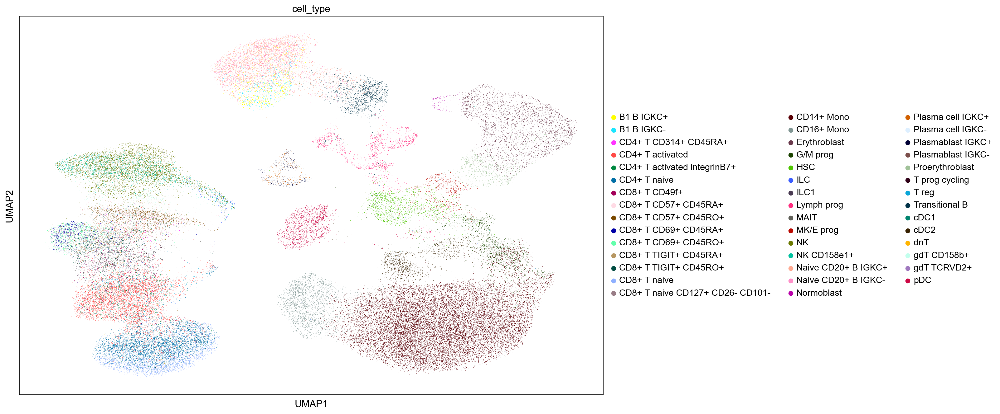

In [29]:
#Whole Neurips dataset plotted

sc.set_figure_params(figsize=(15, 10))

sc.pl.umap(adata_neurips, color = ['cell_type'], color_map = 'viridis')

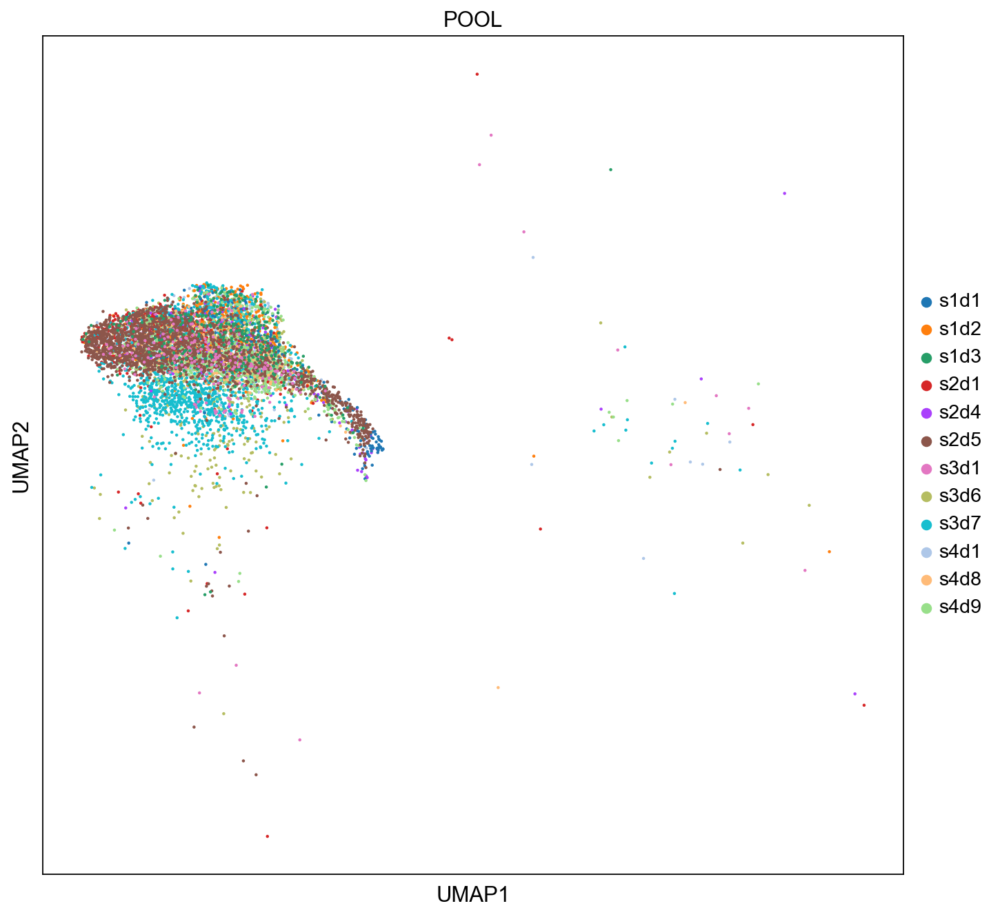

In [30]:
# NK cells from Neurips dataset, coloured by samples

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(neurips_nk, color = ['POOL'], color_map = 'viridis')

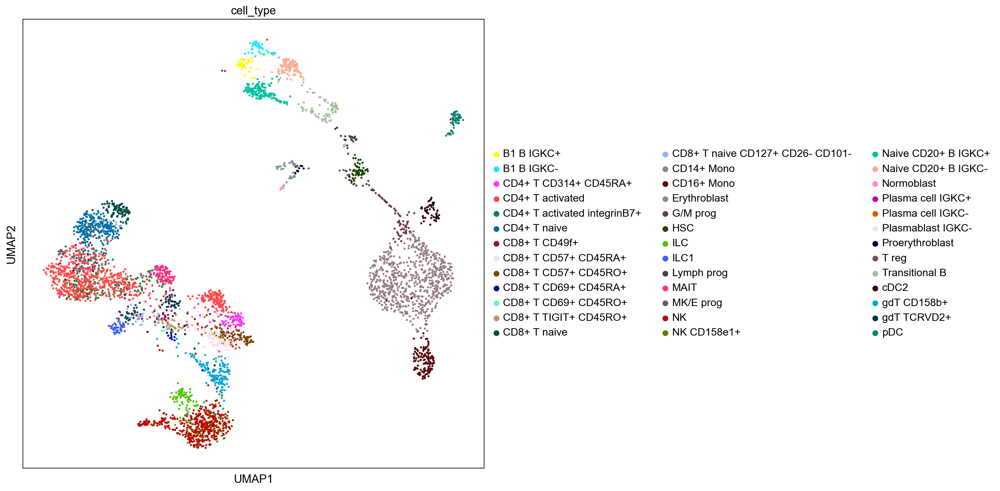

In [24]:
#Only selected sample

sc.set_figure_params(figsize=(10, 10))


sc.pl.umap(eg, color = ['cell_type'], color_map = 'viridis')

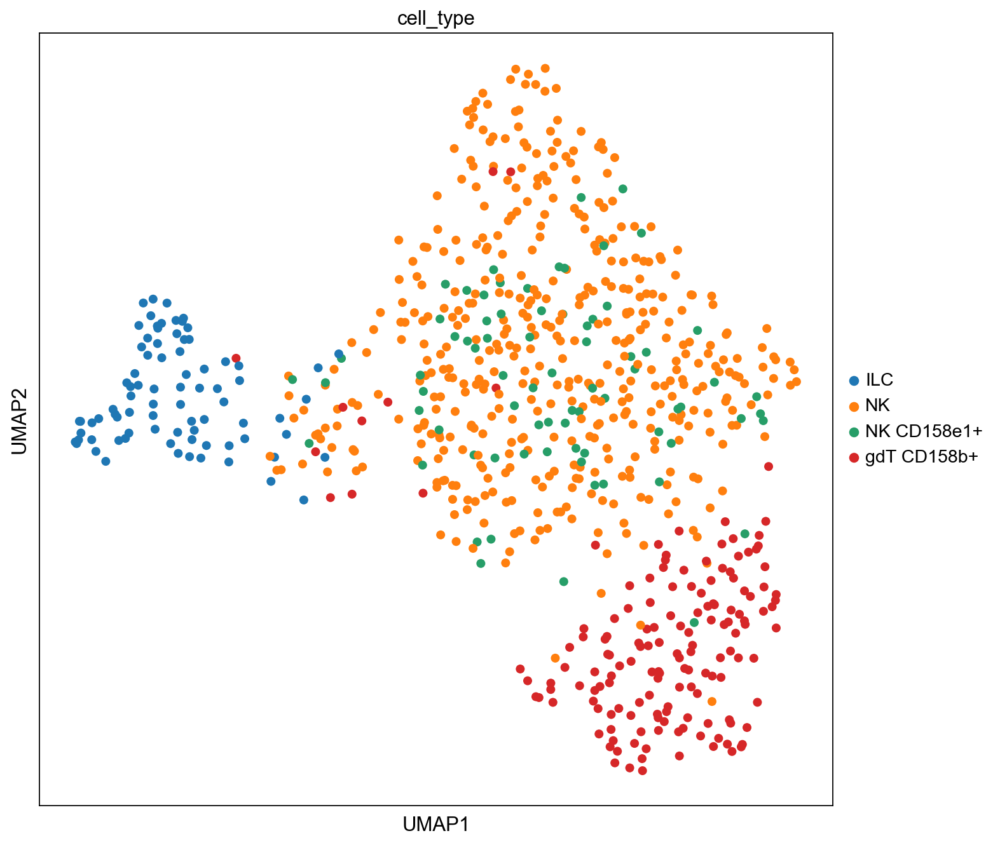

In [27]:
#NK, gd T cells and ILCs from selected sample

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

## Reference 1

###  Surface marker #

- nk_immature = ['CD56']
- nk_activating= ['CD335', 'CD314', 'CD2_prot', 'CD226_prot']
- nk_maturation= ['CD57']

- nk_all_m=[nk_immature, nk_activating, nk_maturation]

### Corresponding RNA #

- nk_immature_rna = ['NCAM1']
- nk_activating_rna= ['NCR1', 'KLRK1', 'CD2', 'CD226']
- nk_maturation_rna= ['B3GAT1']

- nk_all_rna_m=[nk_immature_rna, nk_activating_rna, nk_maturation_rna]

In [31]:
#Reference 1:
#Surface marker

nk_immature= ['CD56']
nk_activating= ['CD335', 'CD314', 'CD2_prot', 'CD226_prot']
nk_maturation= ['CD57']

nk_all_m=[nk_immature, nk_activating, nk_maturation]

#Corresponding RNA

nk_immature_rna= ['NCAM1']
nk_activating_rna= ['NCR1', 'KLRK1', 'CD2', 'CD226']
nk_maturation_rna= ['B3GAT1']

nk_all_rna_m=[nk_immature_rna, nk_activating_rna, nk_maturation_rna]

In [32]:
#Used to check which genes were measured

listOfmarkers= nk_immature_rna

nk_immature_rna=[]

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        nk_immature_rna.append(x)
        
print(nk_immature_rna)

['NCAM1']


In [33]:
eg

AnnData object with n_obs × n_vars = 4450 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44', 'CD14', 'CD16', 'CD25', 'CD45RO',

In [34]:
nk_immature

['CD56']

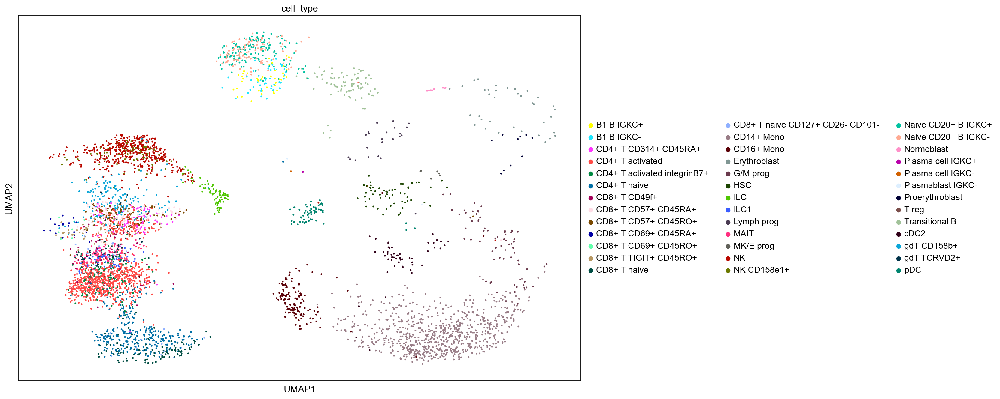

immature markers (upper protein, lower corresponding RNA


TypeError: bad operand type for unary -: 'str'

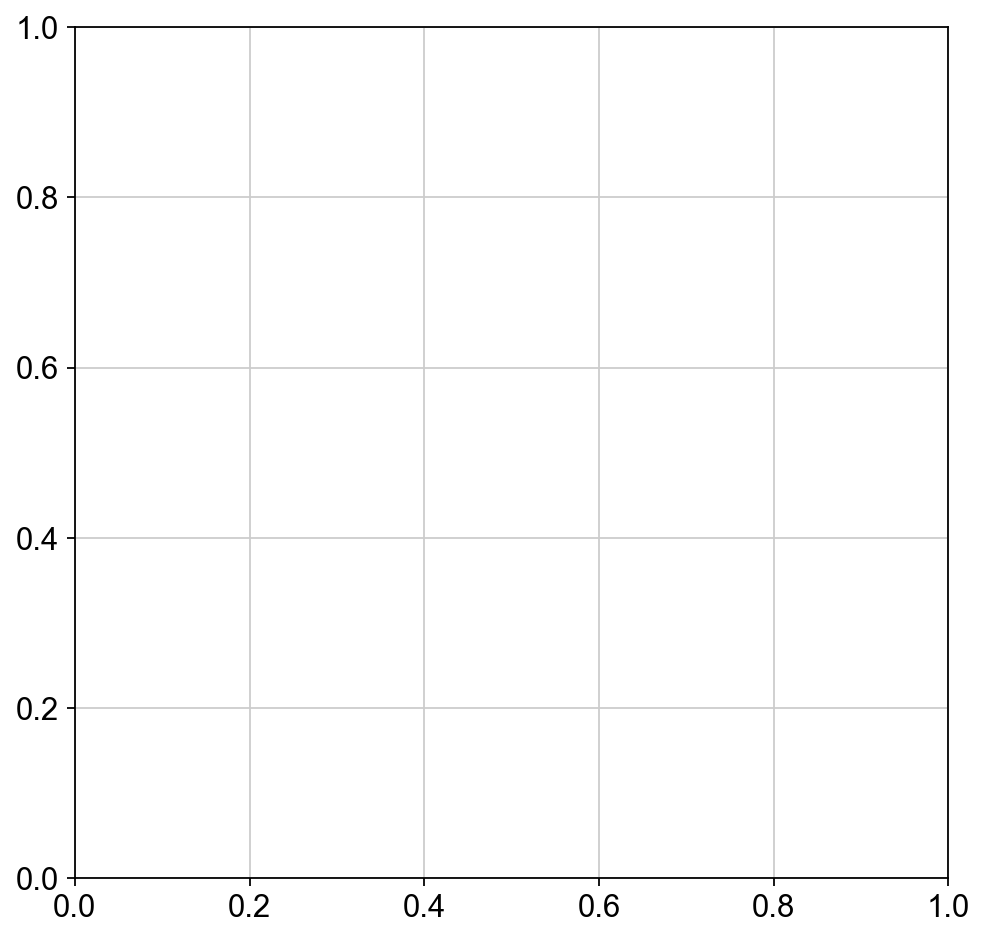

In [39]:
# 1 sample, all cell types

sc.set_figure_params(figsize=(15, 10))
sc.pl.umap(eg, color = ['cell_type'], color_map = 'viridis')


#All cells, 
print("immature markers (upper protein, lower corresponding RNA")

sc.set_figure_params(figsize=(7, 7))
  
sc.pl.umap(eg, color = nk_immature, vmax="p99", color_map = 'viridis')

sc.pl.umap(eg, color = nk_immature_rna, vmax="p99", color_map = 'viridis')

#All cells, maturation marker

print("maturation markers (upper protein, lower corresponding RNA)")
sc.pl.umap(eg, color = nk_maturation, vmax="p99", color_map = 'viridis')

sc.pl.umap(eg, color = nk_maturation_rna, vmax="p99", color_map = 'viridis')

#All cells, activating markers
print("activating markers (upper protein, lower corresponding RNA")
    
sc.pl.umap(eg, color = nk_activating, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(eg, color = nk_activating_rna, vmax="p99", color_map = 'viridis')

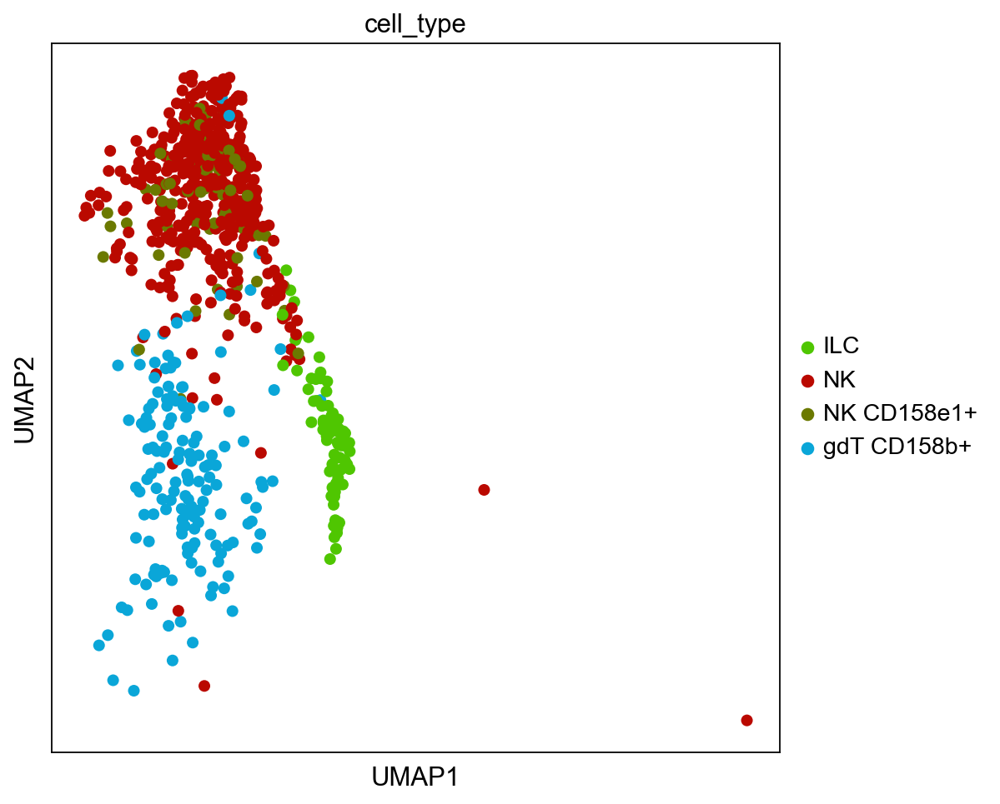

immature markers (upper protein, lower corresponding RNA)


TypeError: bad operand type for unary -: 'str'

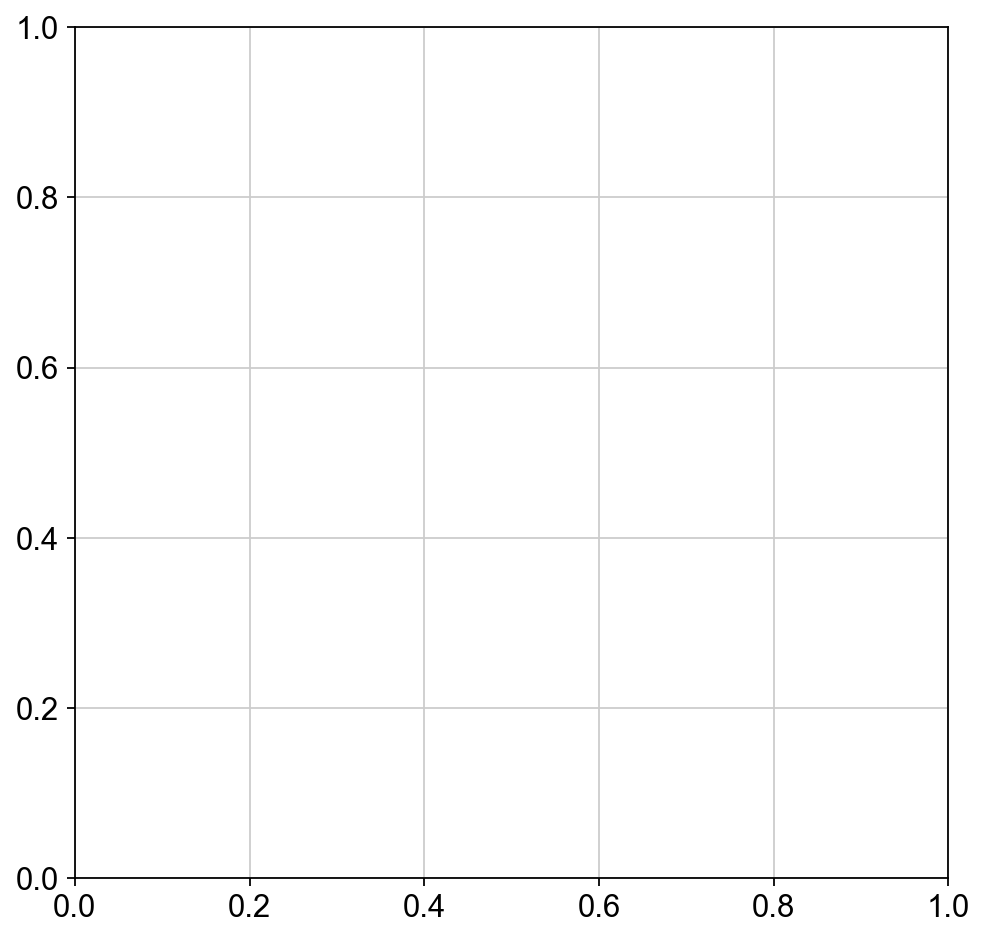

In [40]:
# 1 sample, only selected cell types

sc.set_figure_params(figsize=(7, 7))
sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')


#NK cells, 
print("immature markers (upper protein, lower corresponding RNA)")

sc.set_figure_params(figsize=(7, 7))
  
sc.pl.umap(sample_nk, color = nk_immature, vmax="p99", color_map = 'viridis', ncols=3)

sc.pl.umap(sample_nk, color = nk_immature_rna, vmax="p99", color_map = 'viridis')

#NK cells, maturation marker
print("maturation markers (upper protein, lower corresponding RNA)")

sc.pl.umap(sample_nk, color = nk_maturation, vmax="p99", color_map = 'viridis')

sc.pl.umap(sample_nk, color = nk_maturation_rna, vmax="p99", color_map = 'viridis')

#NK cells, activating markers

print("activating markers (upper protein, lower corresponding RNA)")
    
sc.pl.umap(sample_nk, color = nk_activating, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = nk_activating_rna, vmax="p99", color_map = 'viridis')



## Reference 2, Pfefferle et al. 

- scRNA-seq performed on >26 000 PBMC, healthy donors
- Bulk RNA-seq: CD56bright, CD56dim NK cells, two CD56dim subsets: (NKG2A+KIR− and NKG2A−KIR+9

From immature to the most mature (adaptive) NK cells (bulk RNA-seq):
- CD56 (NCAM1)+
- NKG2A(CD94)+, KIR2DL3(CD158b)−, CD56dim
- NKG2A/KLRC1(CD94)−, KIR2DL3(CD158b)+, CD56dim 
- NKG2A/KLRC1, (CD94)−, KIR2DL3(CD158b)+, NKG2C(CD159c)+, CD56dim (adaptive)

Clustering analysis (5 clusters) by scRNA-seq: 
- Cluster 1: IFNG, OAS1, FGR, CDK6, CCR5 (CD195), SLC37A1, IL2RB(CD122), IL2RG(CD132), IL15RA(CD215), KLRD1(CD94), RUNX3 and IKZF2 (CD56bright, immature NK cells)
- Cluster 2:  XCL1, SELL(CD62L), CCR1(CD191), LEF1, IL7R(CD127), GZMK, LTB, CD27, CCR7(CD197), MYC, CAPG, KIT(CD117), IL23A and BACH2.
- Cluster 3: CCL3, CCL4, CCL5, RORA, GZMA, GZMB, GZMH, GZMM,FCGR3A(CD16), TIGIT (TIGIT), NFKBIA, CX3CR1, PRDM1, ZEB2, TFEB, CD38 (CD56dim subpopulation)
- Cluster 4-5: The comparison between cluster 4 and 5 is represents the transition from conventional to adaptive NK cells and was characterized by a general loss of gene expression


- The largest difference between clusters 2 and 3 (transition from CD56bright to CD56dim. 
- Cluster 3 represents a slightly more activated cell state within the conventional CD56dim NK cell compartment with higher expression of cytokine receptors, CD38, SIGLEC7, KLRB1, and TBX21, rather than being a unique differentiation stage


Transition from CD56bright to CD56dim 
- CD96, TIGIT, PVR, CD226, CD161
- trancriptional program in CD56bright: TFC1, MYC 
- trancriptional program in CD56dim: PRDM1, ZEB2, MAF 

Two CD56bright populations found in pseudotime analysis, population 1 high:
- KLRB1 (CD161) KLRD1 (CD94), NCAM1 (CD56), CD7, IL15RA (CD215), IL2RB (CD122), IL2RG (CD132), RUNX3 and IKZF2 (Ikaros) expression

---------------------------


In [28]:
#Protein

nk_immature_pfef = ['CD56']
nk56dim_pfef = ['CD94','CD158b', 'CD57'] #adaptive NK cells

# corresponding RNA

nk_immature_pfef_rna = ['NCAM1']
nk56dim_pfef_rna = ['KLRC1', 'KIR2DL3', 'B3GAT1']

# nk_adaptive =['CD158b', 'CD159c, CD57'] CD159c not used in Neurips, so this is same as previous

nk_transition= ['TIGIT_prot', 'CD155', 'CD226', 'CD161'] #transition from CD56brigth to CD56dim


c1_pfef = ['CD195', 'CD122', 'CD94']
c2_pfef = ['CD62L', 'CD127', 'CD27_prot', 'TIGIT_prot']
c3_pfef = ['CD16', 'CD38_prot']


pseudotime= ['CD161', 'CD94', 'CD56', 'CD5', 'CD7', 'CD122']

#RNA

c1_pfef_rna = ['CCR5', 'IL2RB', 'KLRD1']
c2_pfef_rna = ['SELL', 'IL7R', 'CD27', 'TIGIT']
c3_pfef_rna = ['FCGR3A', 'CD38']

#Transition from CD56bright to CD56dim

cd56bright_tf_pfef= ['TFC1', 'MYC']
cd56dim_tf_pfef = ['PRDM1', 'ZEB2', 'MAF']
nk_transition_rna= ['TIGIT', 'PVR', 'CD226', 'KLRB1']
pseudotime_rna= ['KLRB1', 'KLRD1', 'NCAM1', 'CD5', 'CD7', 'IL2RB']

In [29]:
#Used to check which genes were measured

listOfmarkers= gammadelta_sep

gammadelta_sep=[]

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        gammadelta_sep.append(x)
        
print(gammadelta_sep)

NameError: name 'gammadelta_sep' is not defined

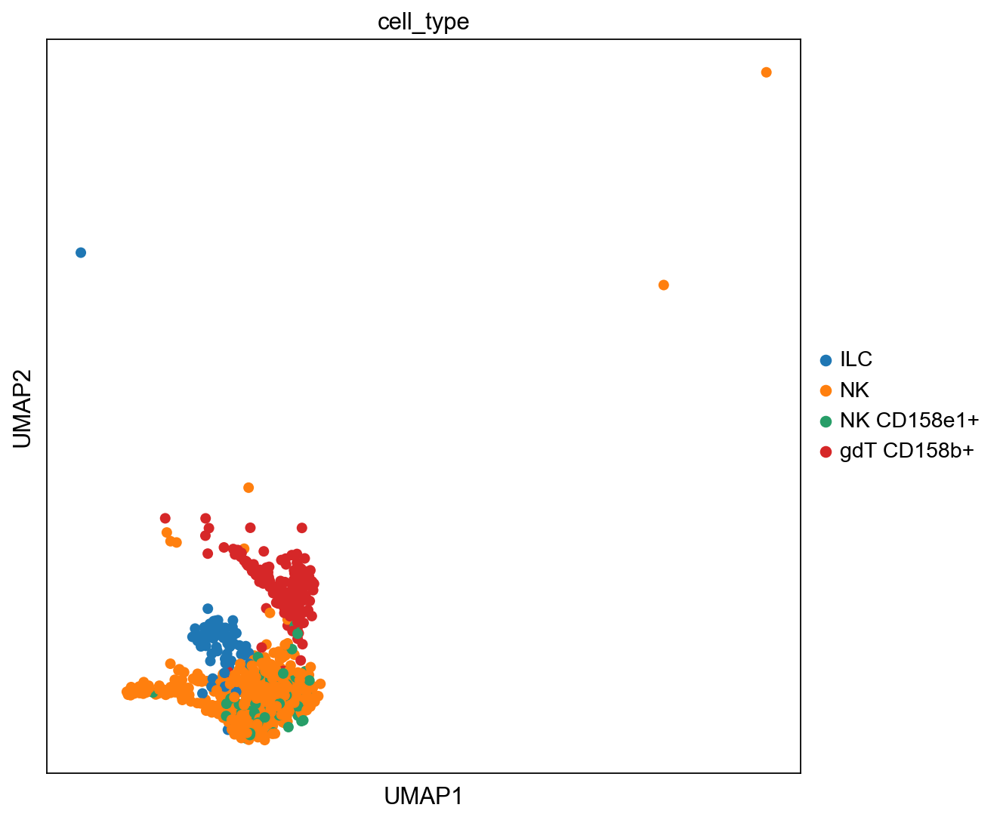

Immature markers, upper protein, below corresponding RNA


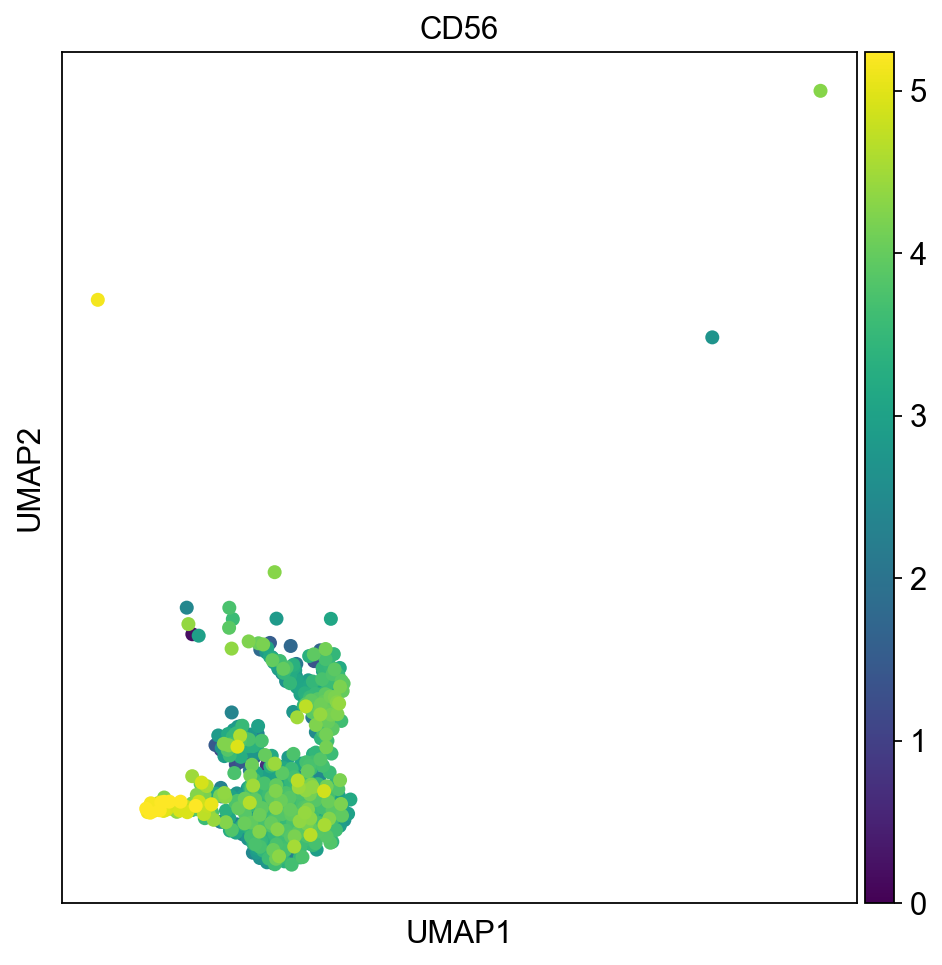

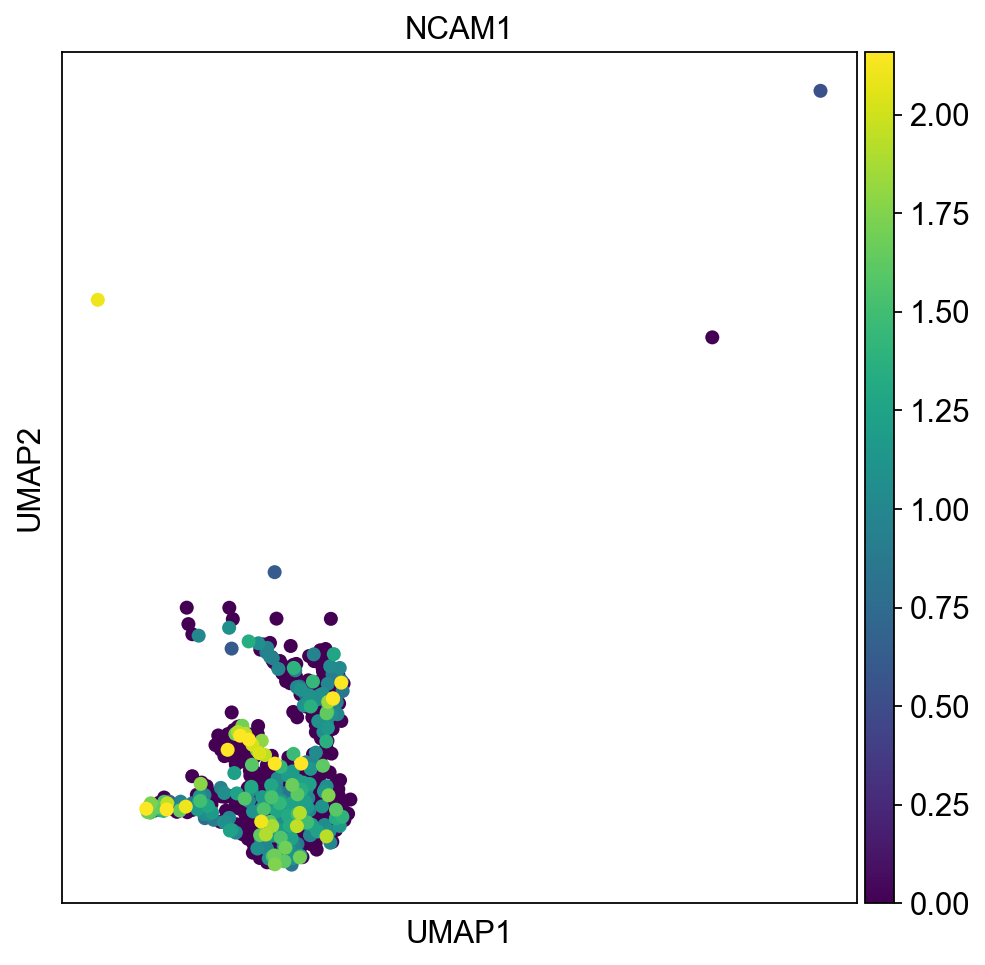

Mature markers, upper protein, below corresponding RNA


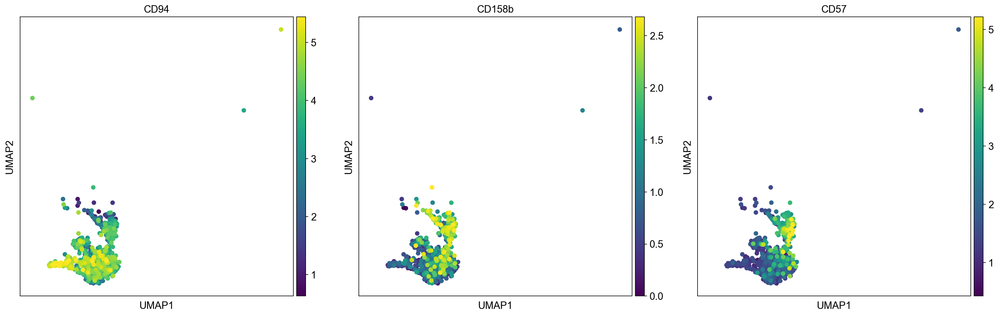

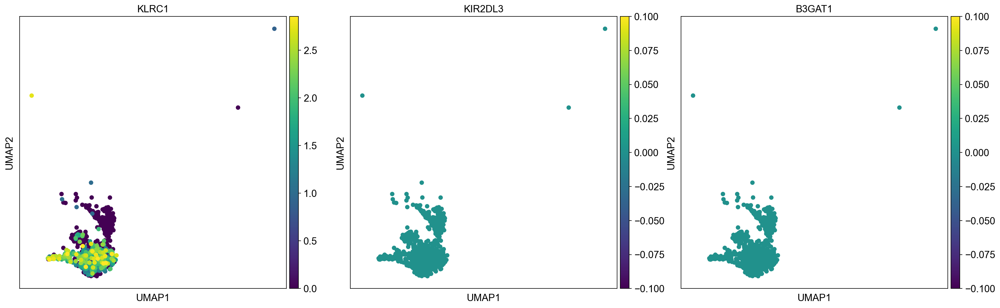

In [30]:
#selected cell types

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#NK immature

print("Immature markers, upper protein, below corresponding RNA")

sc.set_figure_params(figsize=(7, 7))
sc.pl.umap(sample_nk, color = nk_immature_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = nk_immature_pfef_rna, vmax="p99", color_map = 'viridis')

#NK mature (adaptive)

print("Mature markers, upper protein, below corresponding RNA")

sc.pl.umap(sample_nk, color = nk56dim_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = nk56dim_pfef_rna, vmax="p99", color_map = 'viridis')


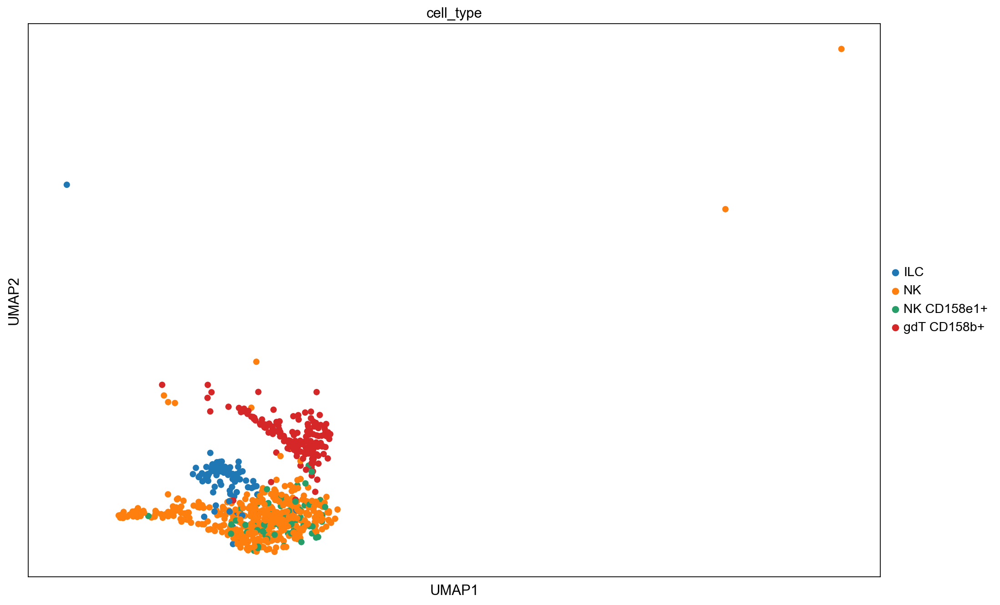

Cluster 1, upper protein, below corresponding RNA, most immature CD56bright


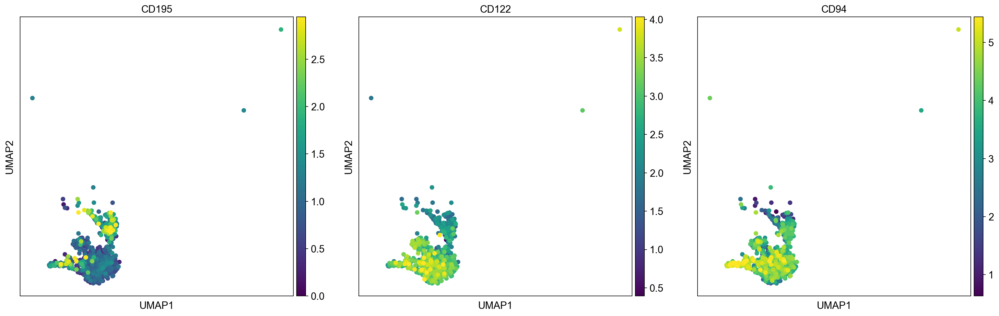

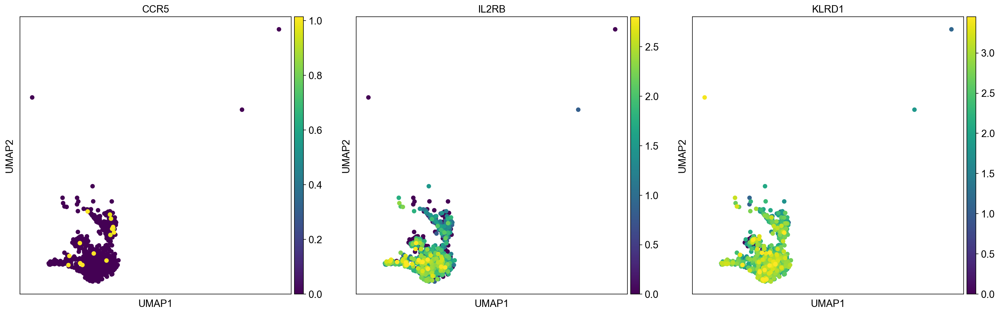

Cluster 2, upper protein, below corresponding RNA


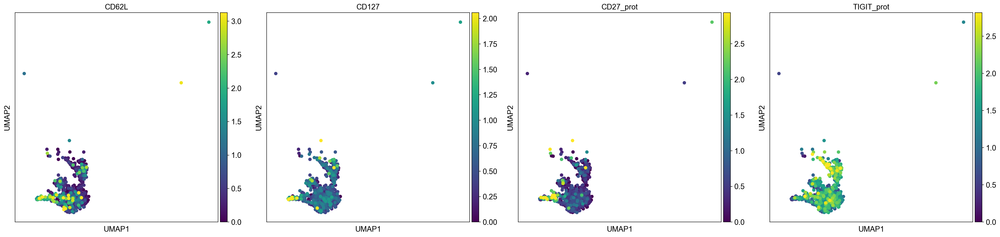

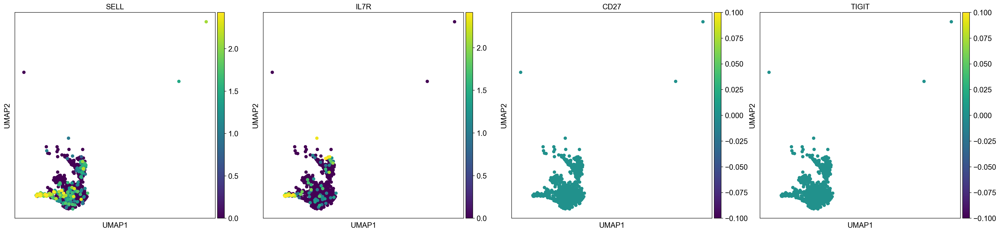

Cluster 3, upper protein, below corresponding RNA, CD56dim


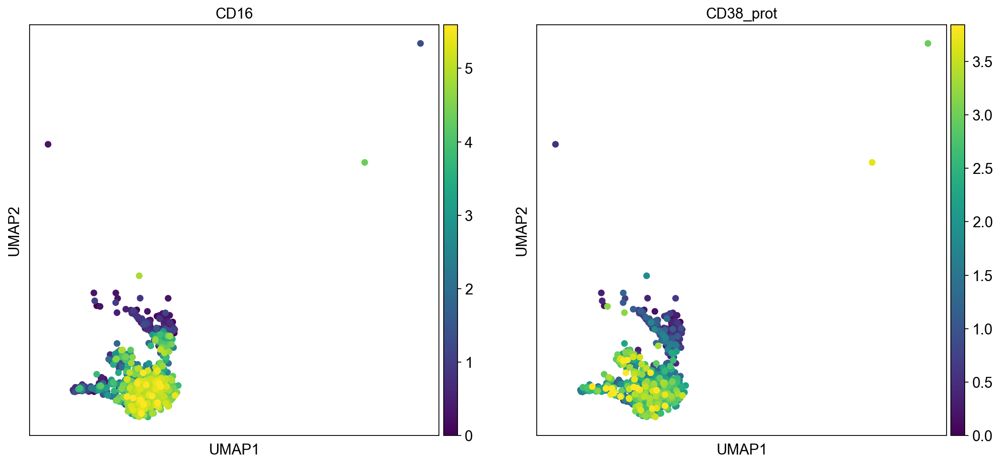

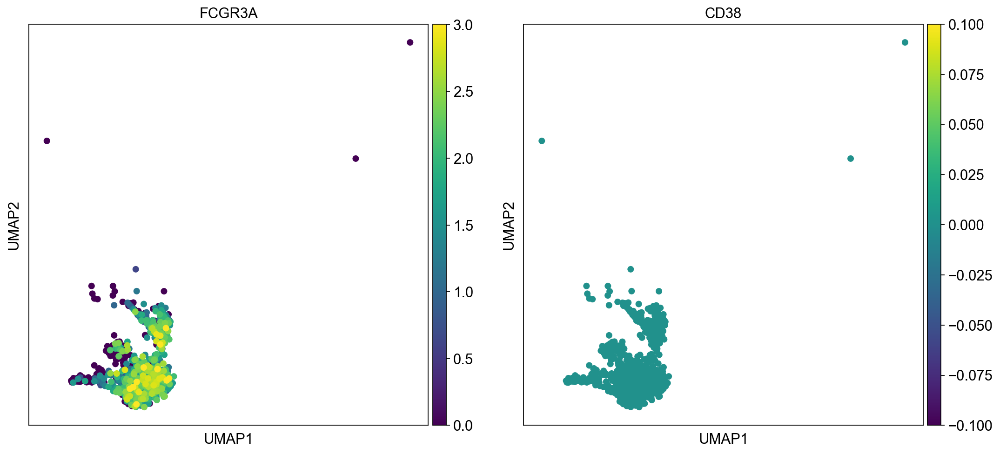

In [31]:
sc.set_figure_params(figsize=(15, 10))
sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#Clusters 1-3 by Pfef

sc.set_figure_params(figsize=(7, 7))

#Cluster 1 (most immature, CD56bright)

print("Cluster 1, upper protein, below corresponding RNA, most immature CD56bright")
sc.pl.umap(sample_nk, color = c1_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = c1_pfef_rna, vmax="p99", color_map = 'viridis')

#Cluster 2 (CD56bright)
print("Cluster 2, upper protein, below corresponding RNA")

sc.pl.umap(sample_nk, color = c2_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = c2_pfef_rna, vmax="p99", color_map = 'viridis')

#Cluster 3 (CD56dim)

print("Cluster 3, upper protein, below corresponding RNA, CD56dim")
sc.pl.umap(sample_nk, color = c3_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = c3_pfef_rna, vmax="p99", color_map = 'viridis')

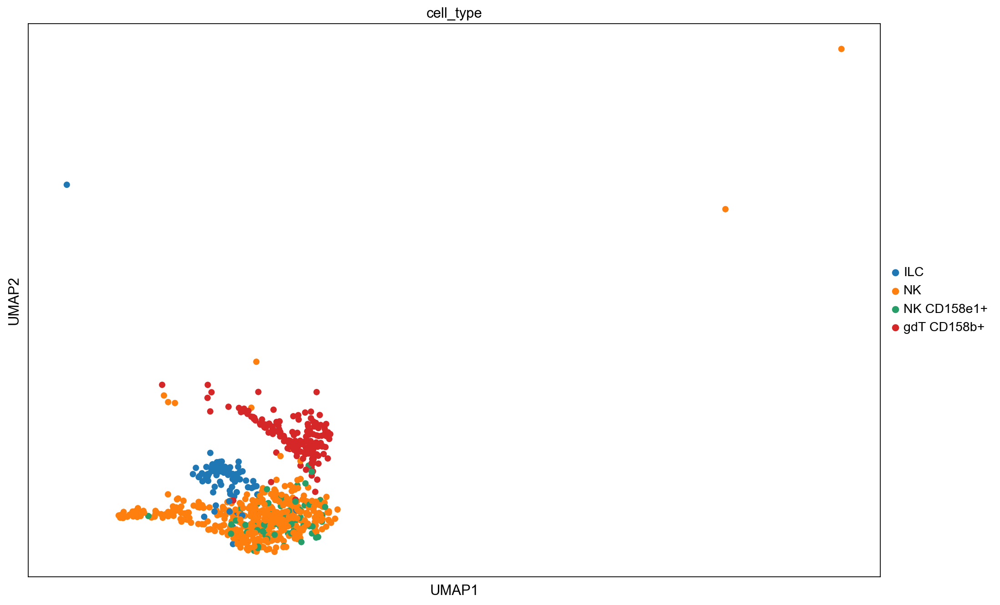

CD56bright, RNA


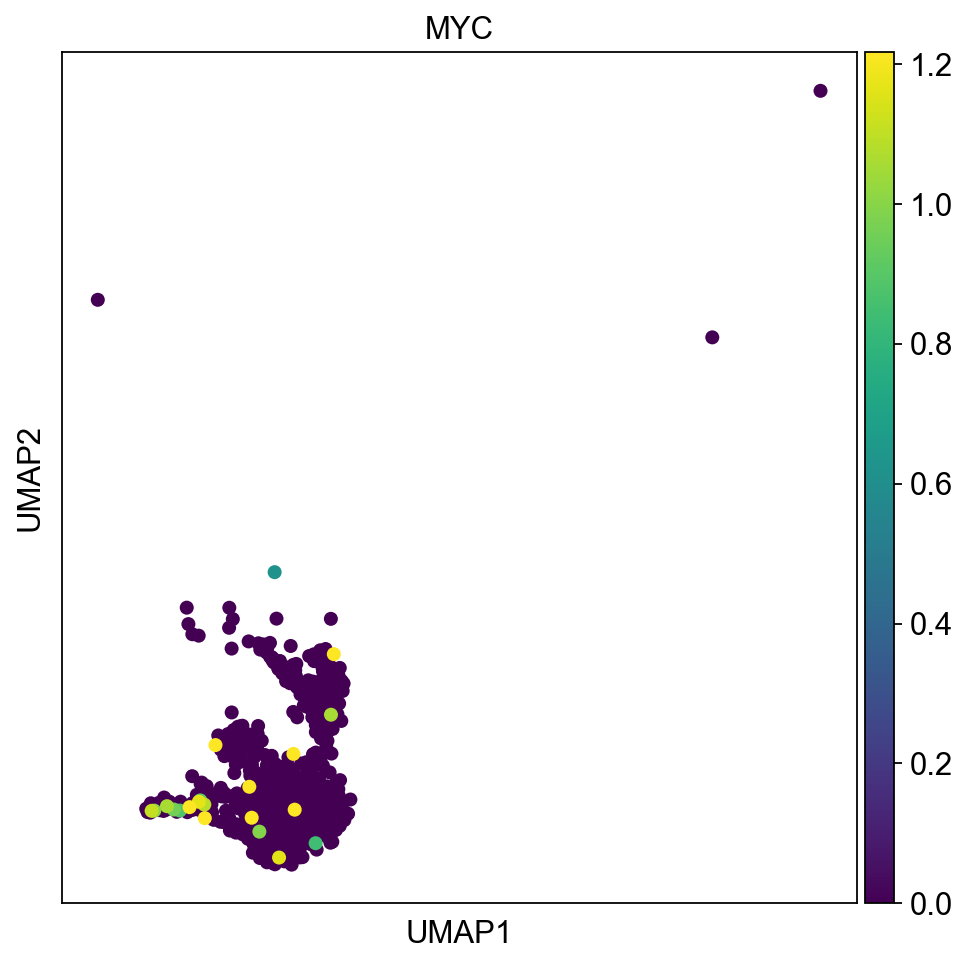

CD56dim, RNA


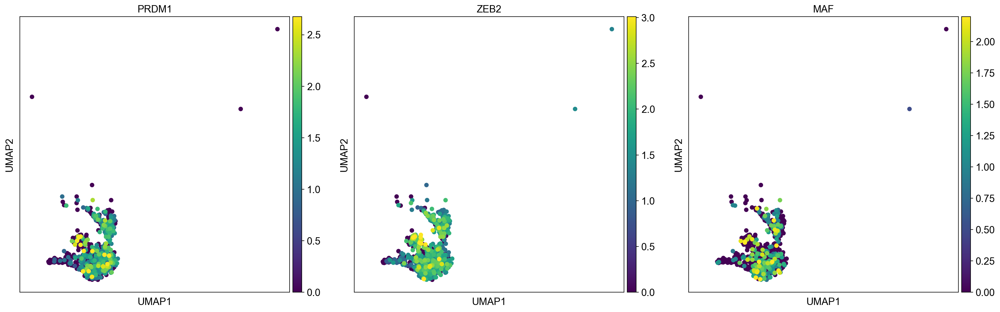

Transition


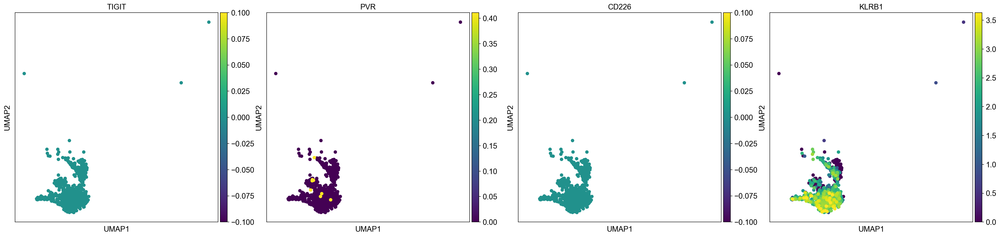

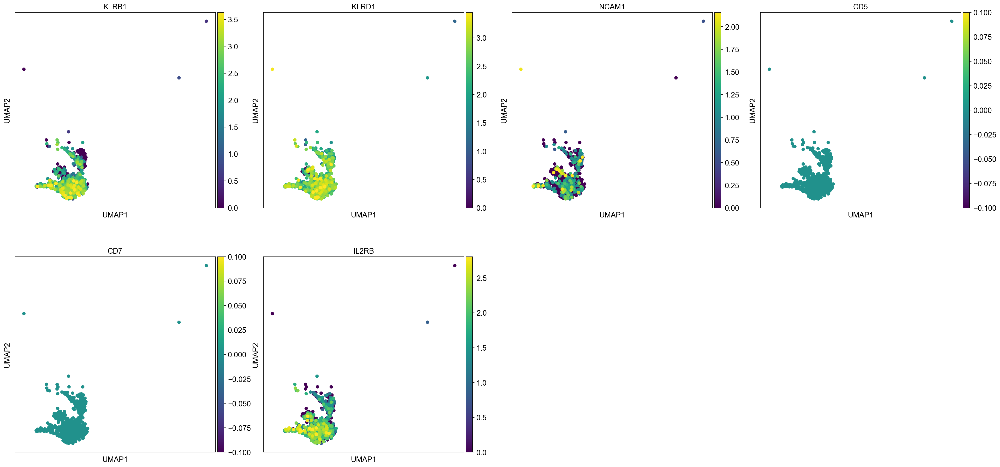

In [32]:
cd56bright_tf_pfef= ['MYC']
cd56dim_tf_pfef = ['PRDM1', 'ZEB2', 'MAF']
nk_transition_rna= ['TIGIT', 'PVR', 'CD226', 'KLRB1']
pseudotime_rna= ['KLRB1', 'KLRD1', 'NCAM1', 'CD5', 'CD7', 'IL2RB']


sc.set_figure_params(figsize=(15, 10))
sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#transition from CD56bright to CD56dim

sc.set_figure_params(figsize=(7, 7))

#TF programs of CD56bright

print("CD56bright, RNA")
sc.pl.umap(sample_nk, color = cd56bright_tf_pfef, vmax="p99", color_map = 'viridis')
    

#TF programs of CD56dim
print("CD56dim, RNA")

sc.pl.umap(sample_nk, color = cd56dim_tf_pfef, vmax="p99", color_map = 'viridis')


#Cluster 3 (CD56dim)

print("Transition")

sc.pl.umap(sample_nk, color = nk_transition_rna, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = pseudotime_rna, vmax="p99", color_map = 'viridis')


## Reference 3, Melsen et al.

- scRNA-seq, bone marrow. CD56, CXCR6, CD117 and CD34 oligonucleotide-conjugated antibodies were used
- healthy donors, 1 BM transplant recipient


- 8 NK cell cluster were defined
- Clusters 1 and 7 represent the most mature CD56bright NK cells (83% of cells belong to cluster 1, which was further divided into 7 subgroups).
- Cluster 4 the most immature CD56bright NK cells 
- Cluster 2 tissue-resident NK cells
- Cluster 5 non-cytotoxic innate lymphoid cells (ILCs)
- Cluster 6 proliferating NK cells
- Cluster 8 CD56- and CD16+ NK cells with reduced effector function
- Cluster 3 = CD34+, CD117+


- Generally, inhibitory KIRs more frequently expressed in terminally differentiated cells, but in this study were not in top5 DE genes. 
- When compering to other datasets,  CD56- NK cells not found (probably donor specific). The CD34+ and ltNK cells were barely detected in blood (likely bone-marrow resident). 
- New identified cluster 2, CD56dim GZMK+. Likely intermediate state between CD56bright and CD56dim


- pseudotime analysis of terminally differentiated cells : FGFBP2, PRF1,GZMB, GZMK. Shift from granzyme K to granzyme B during differentiation. 

In [33]:
#Collecting CLR normalized surface_protein information for the sample

sample_prot=sample_nk.obsm['protein_expression_clr_neurips']

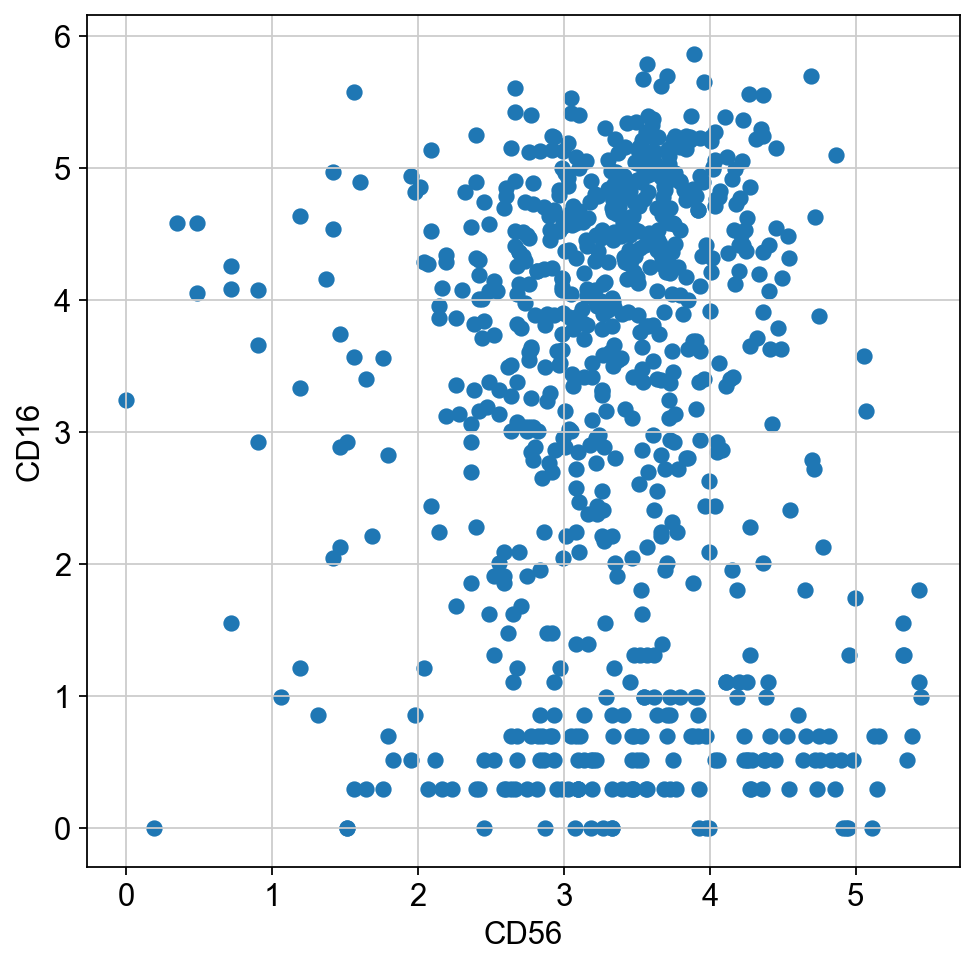

In [34]:
x = sample_prot['CD56']
y = sample_prot['CD16']


plt.scatter(x, y, s=40, cmap='viridis')
plt.xlabel('CD56')
plt.ylabel('CD16') ;

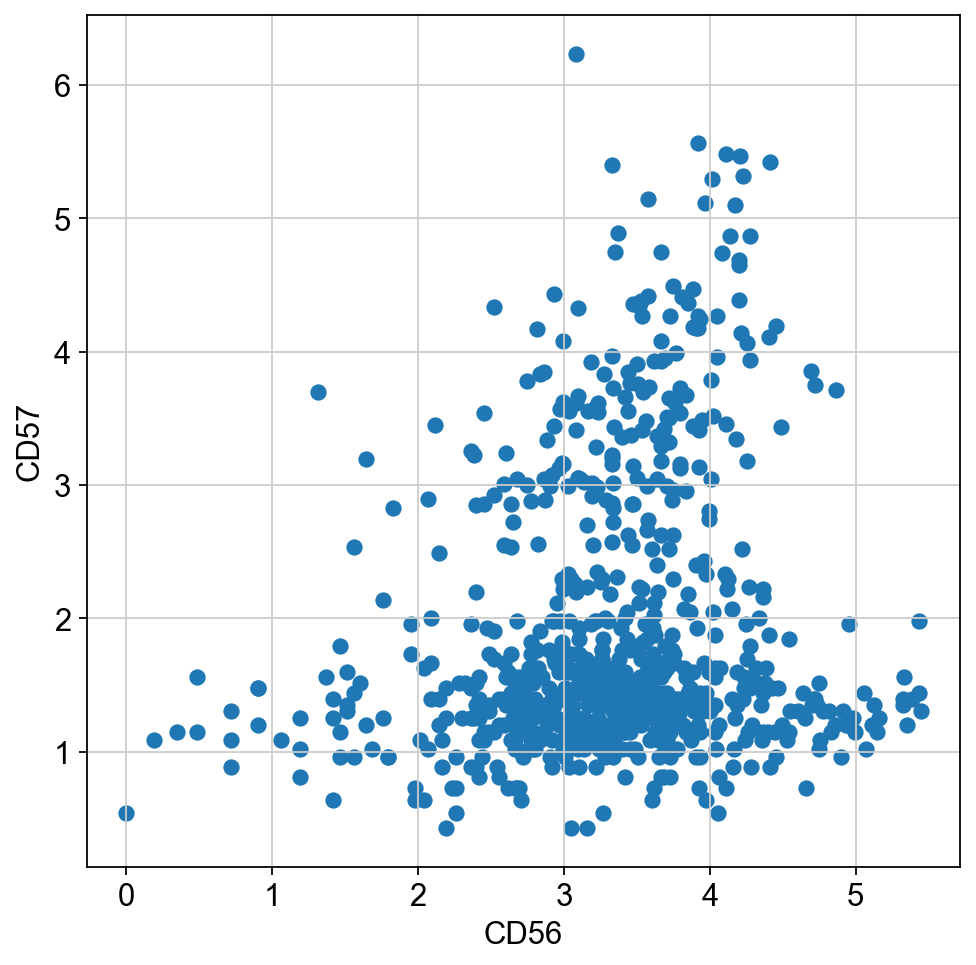

In [35]:
x = sample_prot['CD56']
y = sample_prot['CD57']


plt.scatter(x, y, s=40, cmap='viridis')
plt.xlabel('CD56')
plt.ylabel('CD57') ;

In [36]:
#Used to check which genes were measured

listOfmarkers= tr_mels
tr_mels = []

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        tr_mels.append(x)

print(tr_mels)

NameError: name 'tr_mels' is not defined

In [37]:
#Used to check which markers were measured


listOfmarkers= ['CD160']


for x in listOfmarkers:
    if x in prot.columns:
        print(x)


RNA, NCAM1= CD56, KIT = CD117


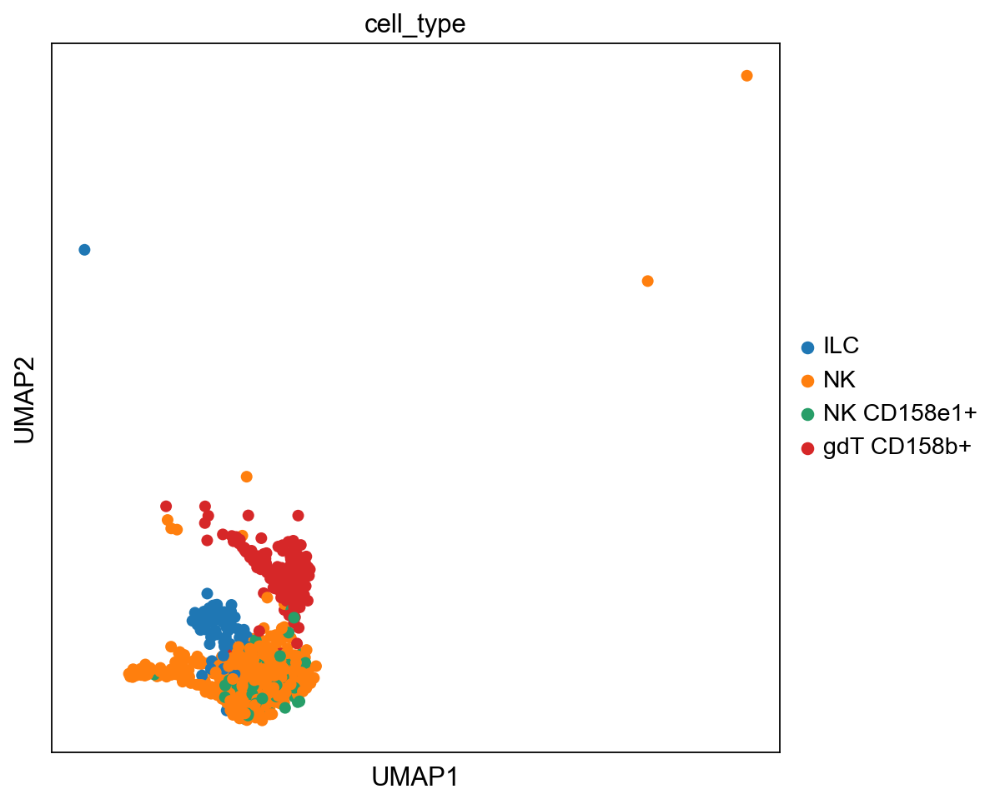

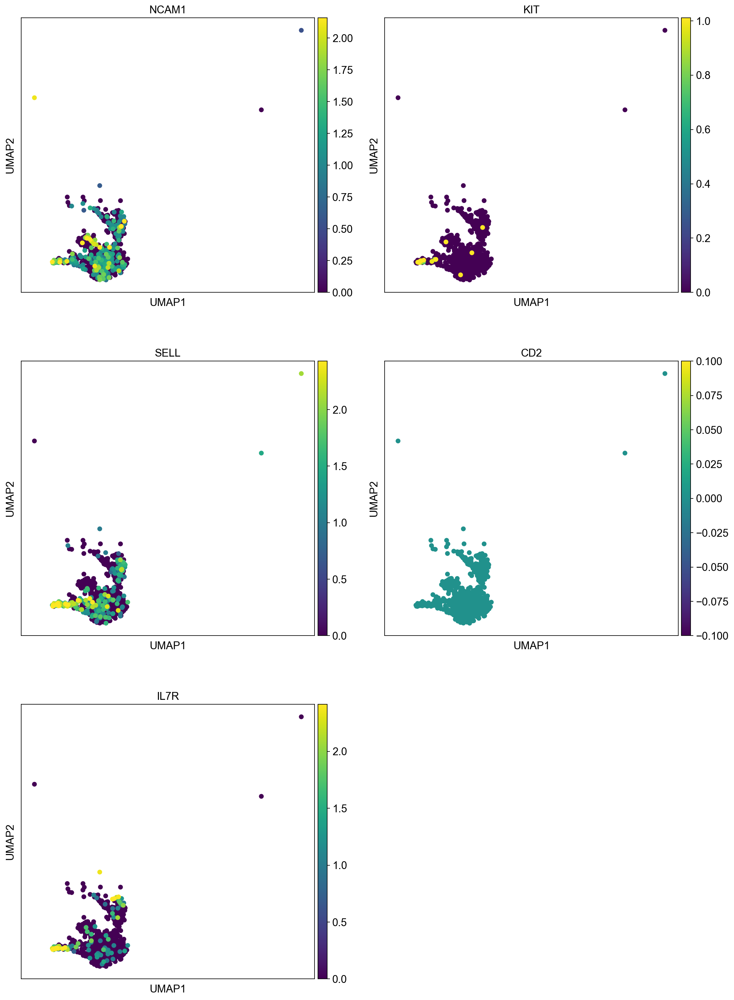

Surface proteins


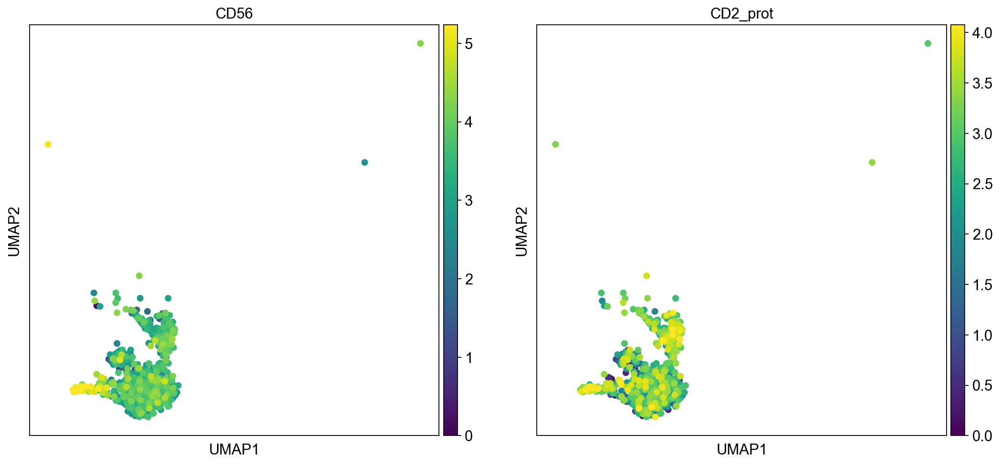

In [38]:
#CD56bright population of immature NK cells, cluster 4 in the paper

cd56bright_mels = ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R']

cd56bright_mels_prot= ['CD56', "CD2_prot"]

sc.set_figure_params(figsize=(7, 7))

#RNA
print("RNA, NCAM1= CD56, KIT = CD117")

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

sc.pl.umap(sample_nk, color = cd56bright_mels, vmax="p99", color_map = 'viridis', ncols=2)

#Surface protein
print("Surface proteins")

sc.pl.umap(sample_nk, color = cd56bright_mels_prot, vmax="p99", color_map = 'viridis', ncols=2)



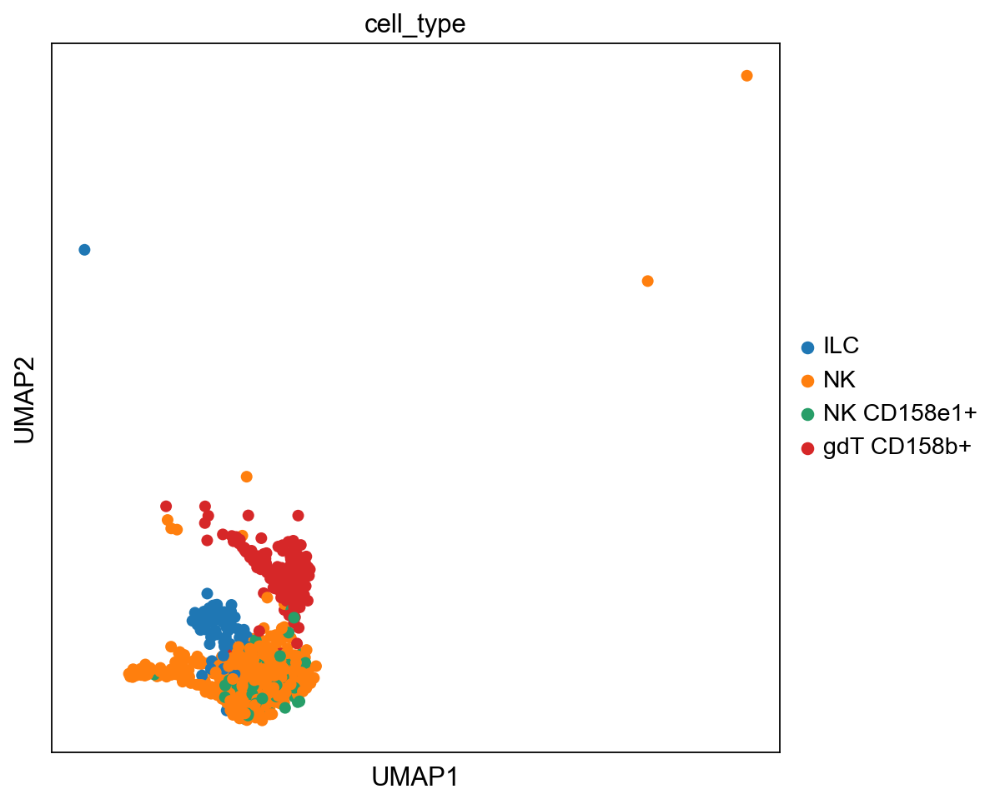

CD56dim, RNA


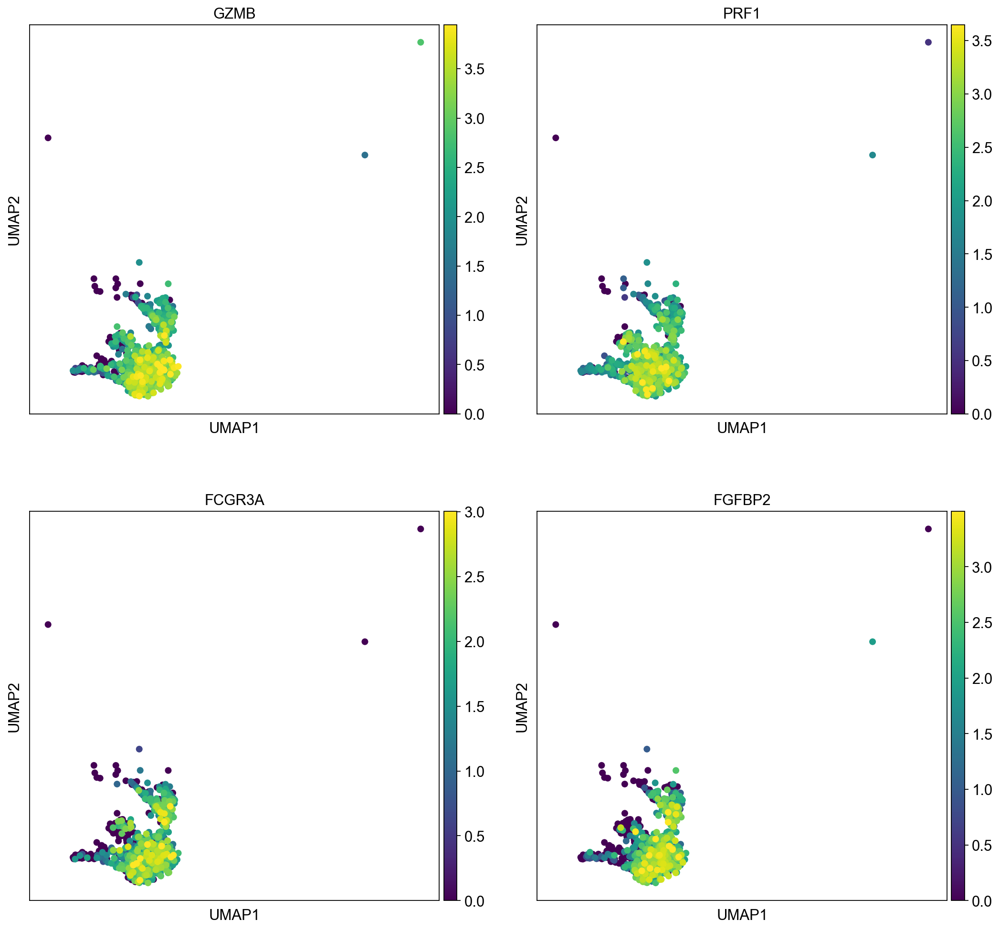

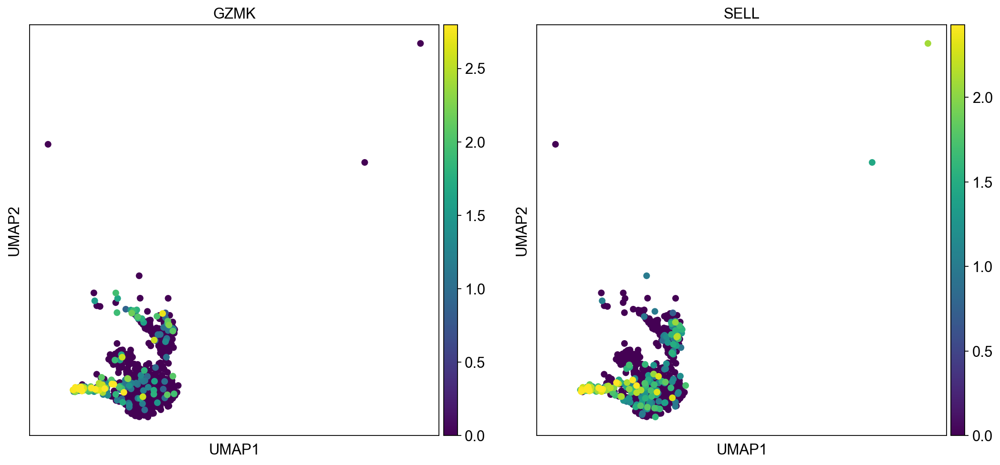

CD56dim surface protein, FCGR3A=CD16, SELL=CD62L


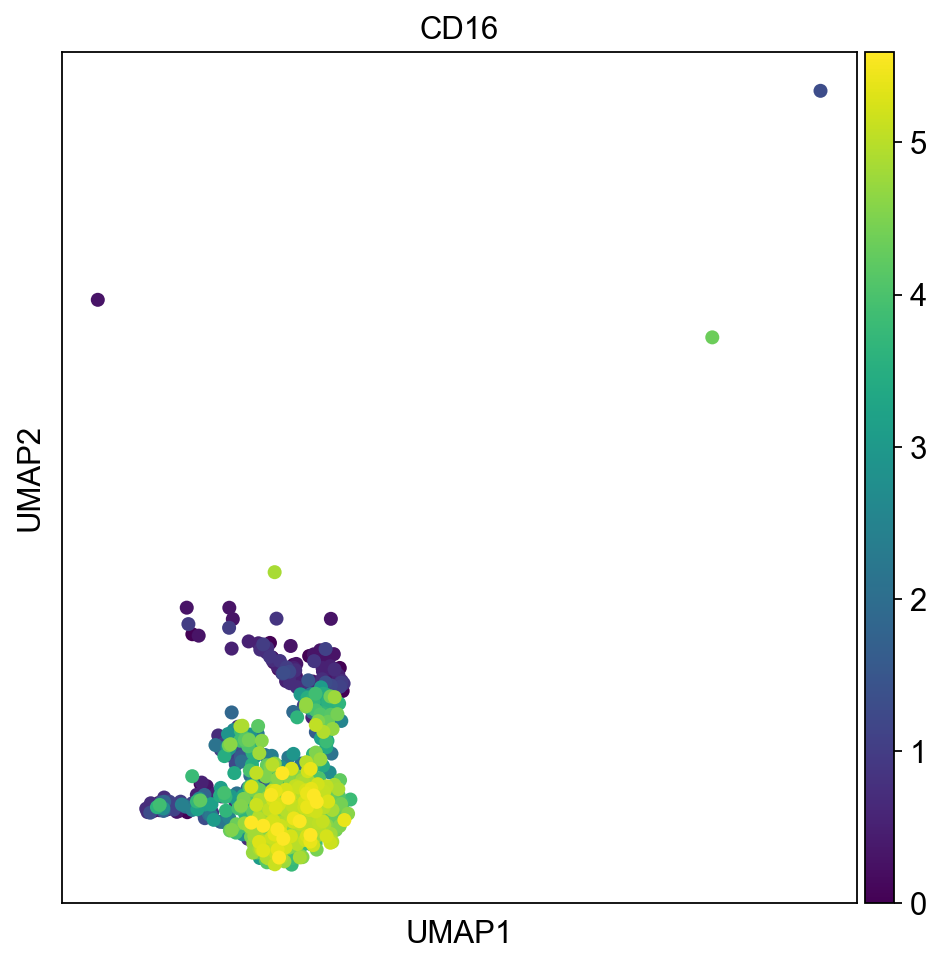

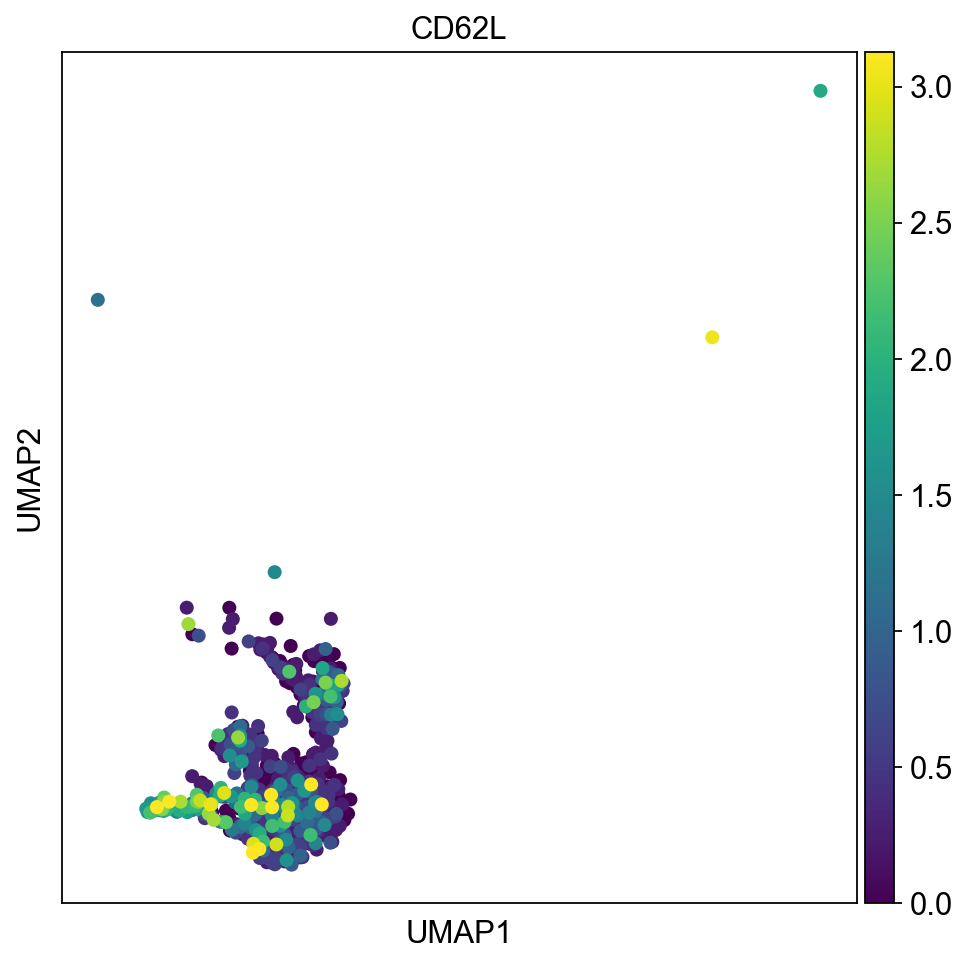

In [39]:
#Two CD56dim populations (adaptive NK cells) identified, clusters 1 and 7 defined in the paper

cd56dim_mels_1= ['GZMB', 'PRF1', 'FCGR3A', 'FGFBP2']
cd56dim_mels_2 = ['GZMK', 'SELL'] #higher expression of these markers


cd56dim_mels_1_prot = ['CD16']

cd56dim_mels_2_prot  = ['CD62L'] #intermediate state between CD56bright and CD56dim.

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#RNA
print('CD56dim, RNA')
sc.pl.umap(sample_nk, color = cd56dim_mels_1, vmax="p99", color_map = 'viridis', ncols=2)
sc.pl.umap(sample_nk, color = cd56dim_mels_2, vmax="p99", color_map = 'viridis', ncols=2)


print("CD56dim surface protein, FCGR3A=CD16, SELL=CD62L")

sc.pl.umap(sample_nk, color = cd56dim_mels_1_prot, vmax="p99", color_map = 'viridis', ncols=2)
sc.pl.umap(sample_nk, color = cd56dim_mels_2_prot, vmax="p99", color_map = 'viridis', ncols=2)

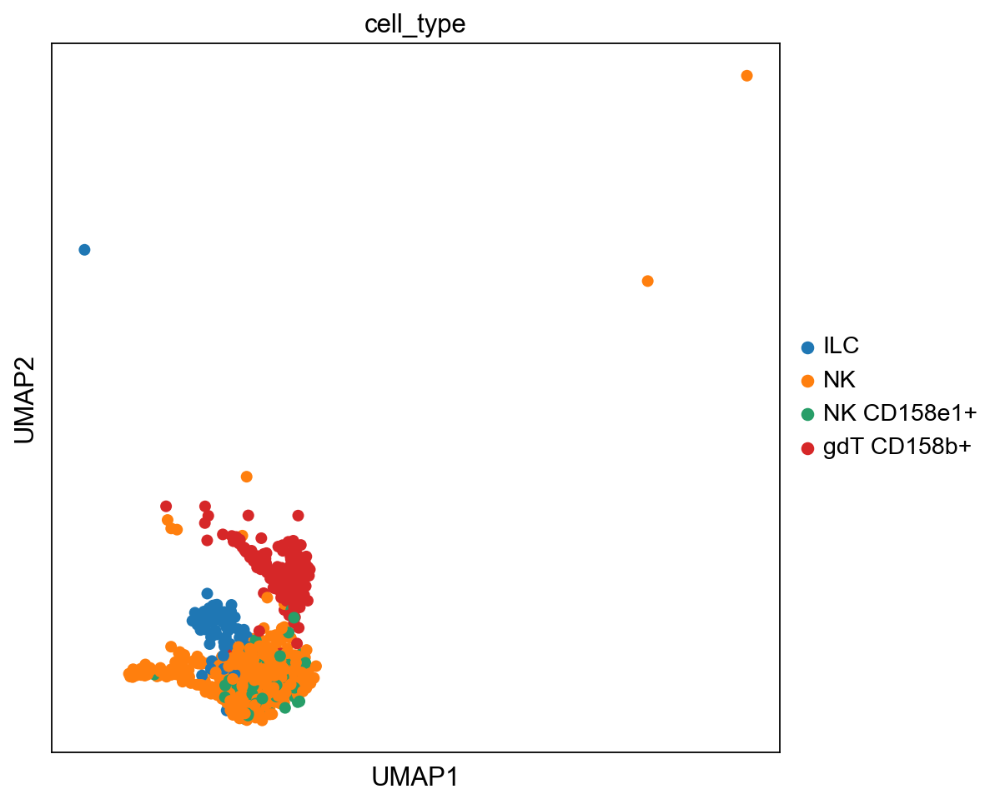

Tissue-resident, RNA


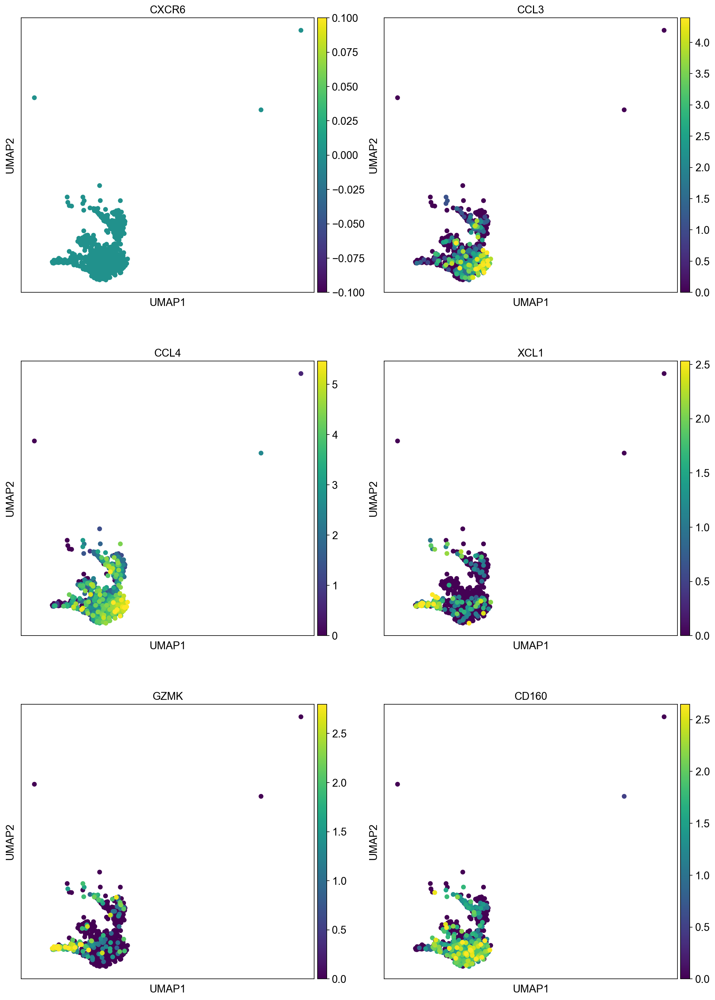

In [40]:
# Tissue resident NK cells, cluster 2 in the paper

tr_mels= ['CXCR6', 'CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160']


# No corresponding surface markers 


sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')


#RNA
print('Tissue-resident, RNA')
sc.pl.umap(sample_nk, color = tr_mels, vmax="p99", color_map = 'viridis', ncols=2)


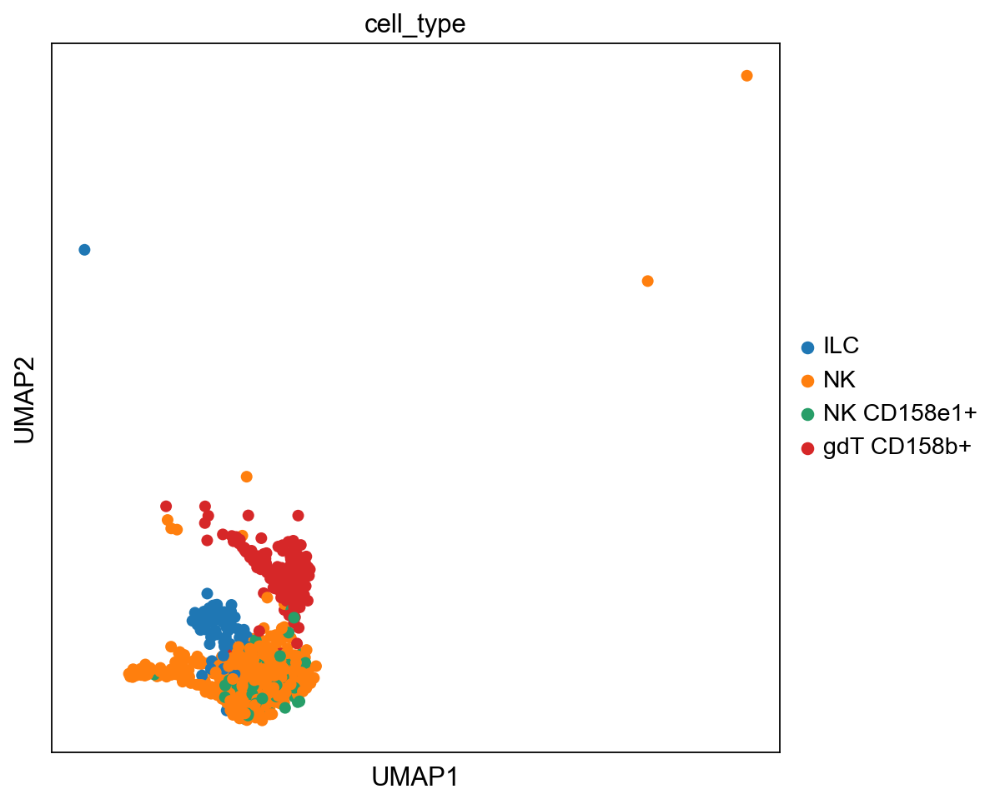

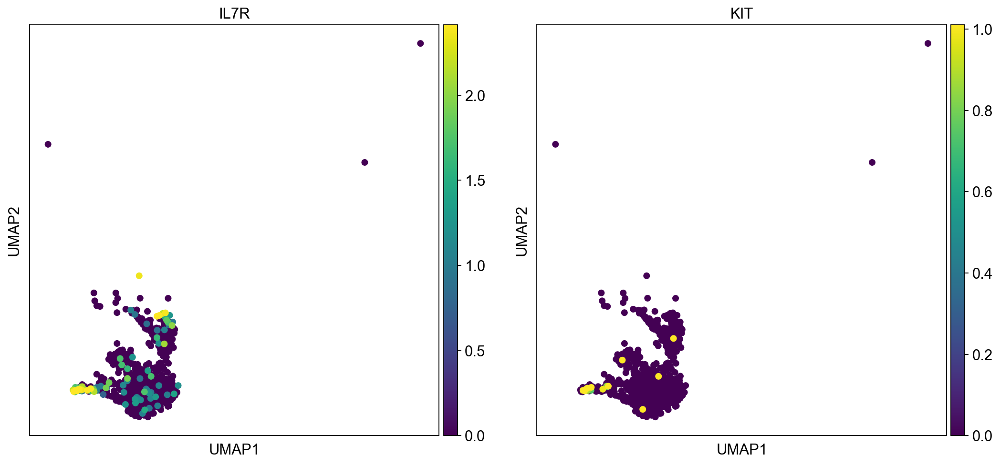

In [41]:
#non-cytotoxic innate lymphoid cells (ILCs), cluster 5 in the paper
# "The absence of NKG7, and high expression of IL7R suggests that these cells are non-cytotoxic innate lymphoid cells"

ILC_mels = ['IL7R', 'KIT'] 

#KIT = CD117 (not included in antibody panel)

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#RNA
sc.pl.umap(sample_nk, color = ILC_mels, vmax="p99", color_map = 'viridis', ncols=2)



In [42]:

listOfmarkers= prolif_mels
prolif_mels = []

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        prolif_mels.append(x)

print(prolif_mels)

NameError: name 'prolif_mels' is not defined

In [ ]:
#proliferating NK cells, mixed population of CD56bright and CD56 cells, cluster 6 in the paper

prolif_mels = ['STMN1', 'CRIP1', 'TYMS', 'FGFBP2', 'HMGB2', 'GZMA', 'PCLAF', 'NKG7']

sc.set_figure_params(figsize=(7, 7))
sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#proliferating, RNA
print("RNA")

sc.pl.umap(sample_nk, color = prolif_mels, vmax="p99", color_map = 'viridis', ncols=2)

In [ ]:
# CD56dim cells with reduced effector function, cluster 8 in the paper

red_eff_mels = ['NKG7', 'FCGR3A']
red_eff_mels_prot = ['CD16']

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#RNA
print("RNA")

sc.pl.umap(sample_nk, color = red_eff_mels , vmax="p99", color_map = 'viridis', ncols=2)

#Surface proteins 
print("Surface protein, FCGR3A=CD16")

sc.pl.umap(sample_nk, color = red_eff_mels_prot , vmax="p99", color_map = 'viridis', ncols=2)




In [ ]:
#Cluster 3, precursors? 

#RNA
print('RNA')
clust3_mels = ['CD34', 'KIT']

sc.pl.umap(sample_nk, color = clust3_mels , vmax="p99", color_map = 'viridis', ncols=2)

#Surface proteins
# KIT=CD117, was not used in the antibody panel

print("Surface protein")

clust3_mels_prot = ['CD34']

sc.pl.umap(sample_nk, color = clust3_mels_prot , vmax="p99", color_map = 'viridis', ncols=2)



RNA


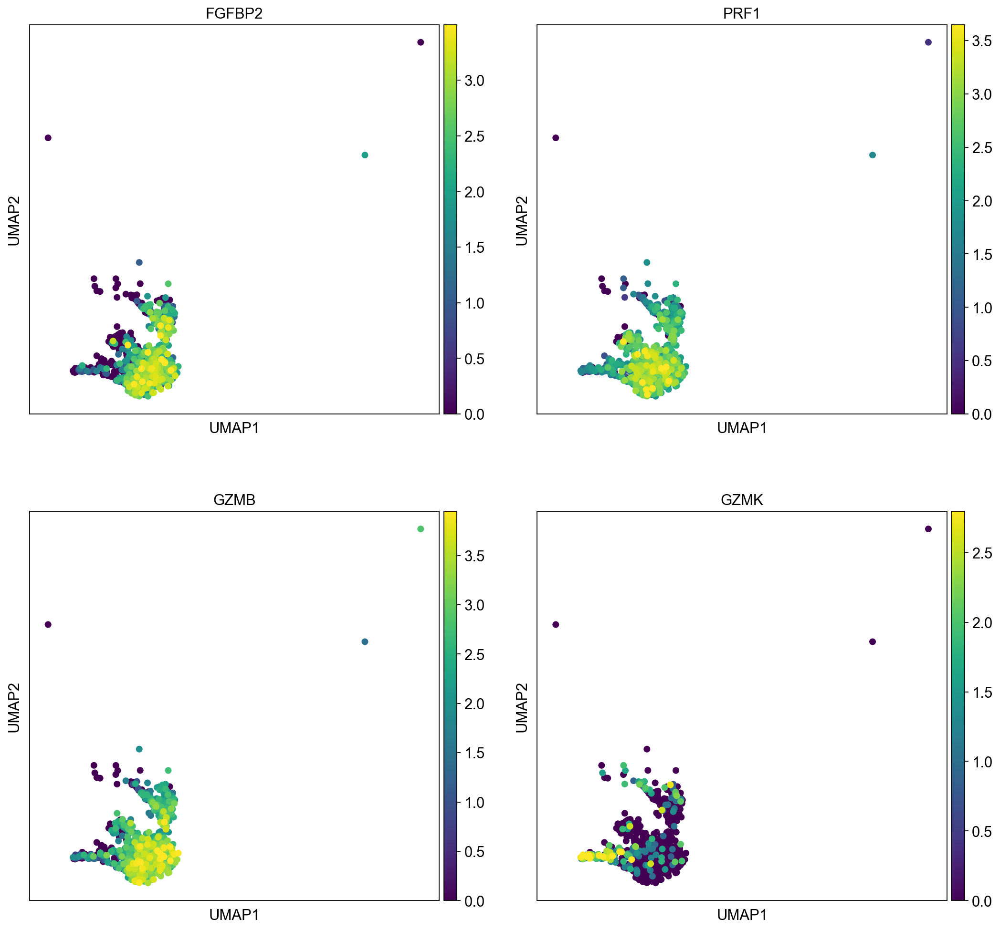

In [43]:
#Markers from pseudotime analysis, granzyme K -> granzyme B (transition from CD56bright to CD56dim)

pseudo_mels = ['FGFBP2', 'PRF1', 'GZMB', 'GZMK']

#RNA

print('RNA')

sc.pl.umap(sample_nk, color = pseudo_mels , vmax="p99", color_map = 'viridis', ncols=2)



## Reference 4 Yang et al. 

- sscRNA-seq on BM and PB
- cells from six BM donors were combined into one group and the two peripheral blood donors into another for analyses. In totsl, 5567 and 3046 NK cells from the BM and blood. 

- Recently, the definition of the NK cell-restricted progenitor population has been redefined as Lin− CD34+CD38+CD123−CD45RA+CD7+CD10+CD127− cells as a consistent fraction of putative NK precursors in secondary lymphoid organs turn out to be ILCs or ILC progenitors

- NK cell maturation occurs mostly in secondary lymphidal organs. The analyses of NK cells from secondary lymphoidal organs will give insights into early NK developmental stages. In this study they were not able to detect earlier development states of NK cells
- 


- NK lineage: CD94 (KLRD1), NKp80 (KLRF1), NKG7, GNLY. NCAM1 (CD56) was not well represented in this study
- NK cell progenitors/ILCs: Lin−, CD7+ (not all yet CD56+). 
-  7 clusters from BM NK cells: 
    - CD56bright NK
    - Transitional NK
    - Active NK,  
    - Adaptive NK
    - Mature NK 
    - Terminal NK
    - Inflamed NK
- CD56brigh: IL7RA (IL7R), CD62L (SELL), NKG2A (KLRC1), and granzyme K (GZMK)
- 


In [44]:
is_nk_yang = ['KLRD1', 'KLRF1', 'NKG7', 'GNLY', 'NCAM1'] #the most DE genes in NK cells
is_nk_yang_prot = ['CD94', 'CD56'] #NKp80 not in the ab panel of Neurips

# KLRD1 = CD94, NCAM1 = CD56

In [45]:
#Used to check which genes were measured

listOfmarkers= is_nk_yang
is_nk_yang = []

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        is_nk_yang.append(x)

print(is_nk_yang)


['KLRD1', 'KLRF1', 'NKG7', 'GNLY', 'NCAM1']


In [46]:
#Used to check which markers were measured


listOfmarkers= is_nk_yang_prot
is_nk_yang_prot= []

for x in listOfmarkers:
    if x in prot.columns:
        print(x)



CD94
CD56


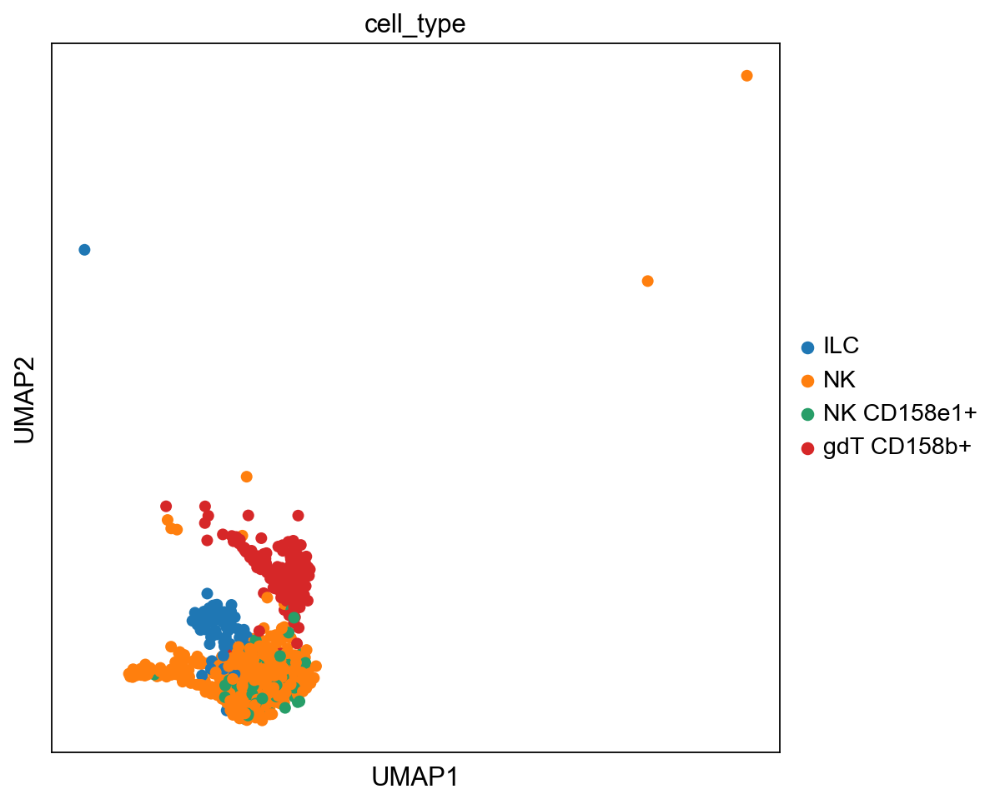

Is NK cell, RNA


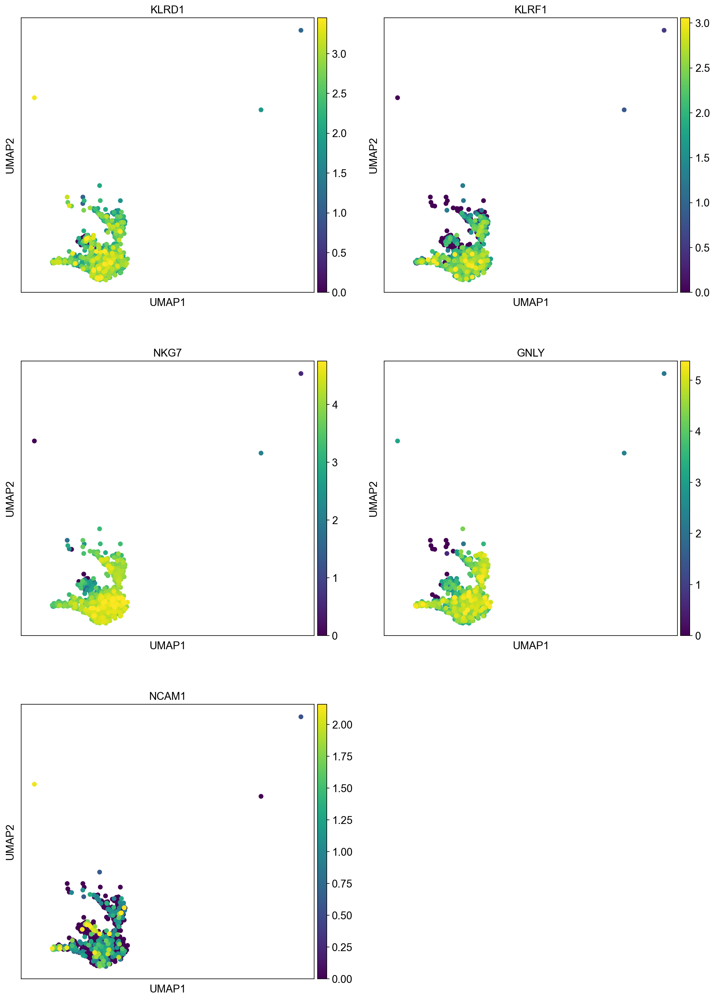

Is NK cell, protein (KLRD1 = CD94, NCAM1 = CD56)


ValueError: Could not broadast together arguments with shapes: [0, 1].

In [47]:
#Nk cell lineage definition


sc.pl.umap(sample_nk, color = ['cell_type'], vmax="p99", color_map = 'viridis', ncols=2)

print("Is NK cell, RNA")
sc.pl.umap(sample_nk, color = is_nk_yang, vmax="p99", color_map = 'viridis', ncols=2)

print("Is NK cell, protein (KLRD1 = CD94, NCAM1 = CD56)")

sc.pl.umap(sample_nk, color = is_nk_yang_prot, vmax="p99", color_map = 'viridis')

Immature CD56bright NK cell, RNA


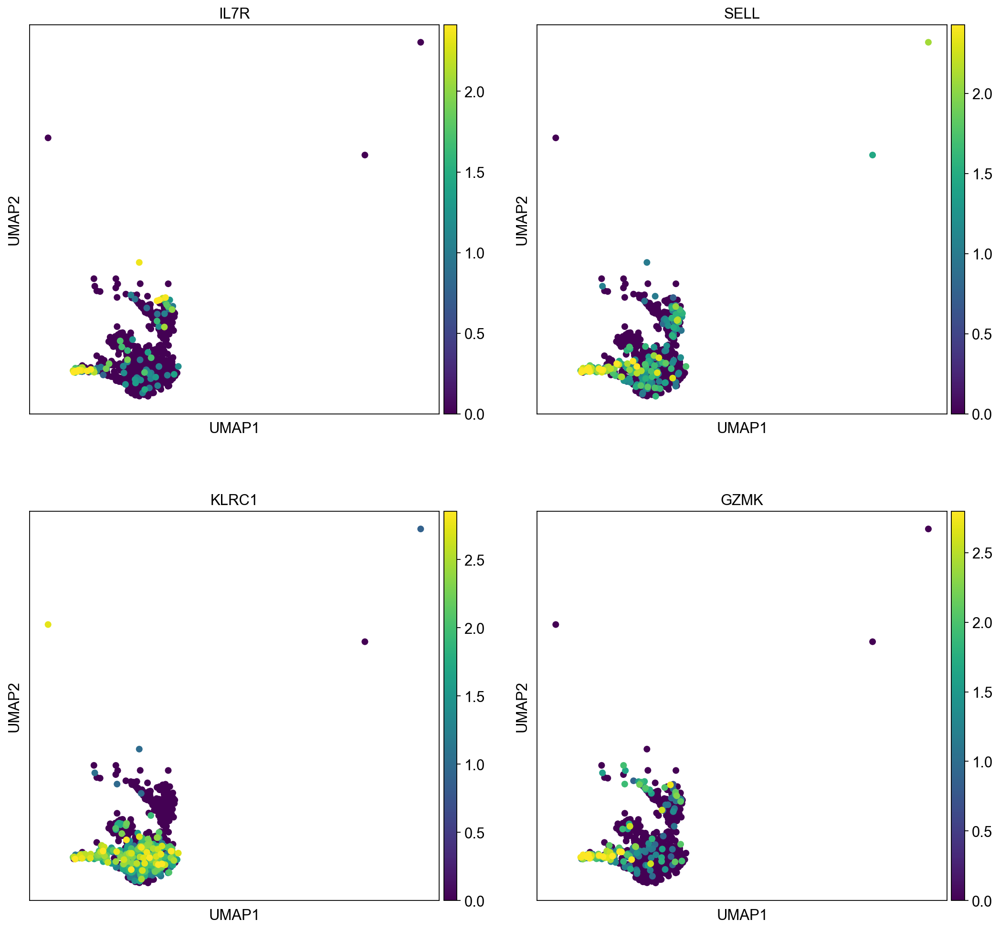

Immature CD56bright NK cell, protein (SELL=CD62L)


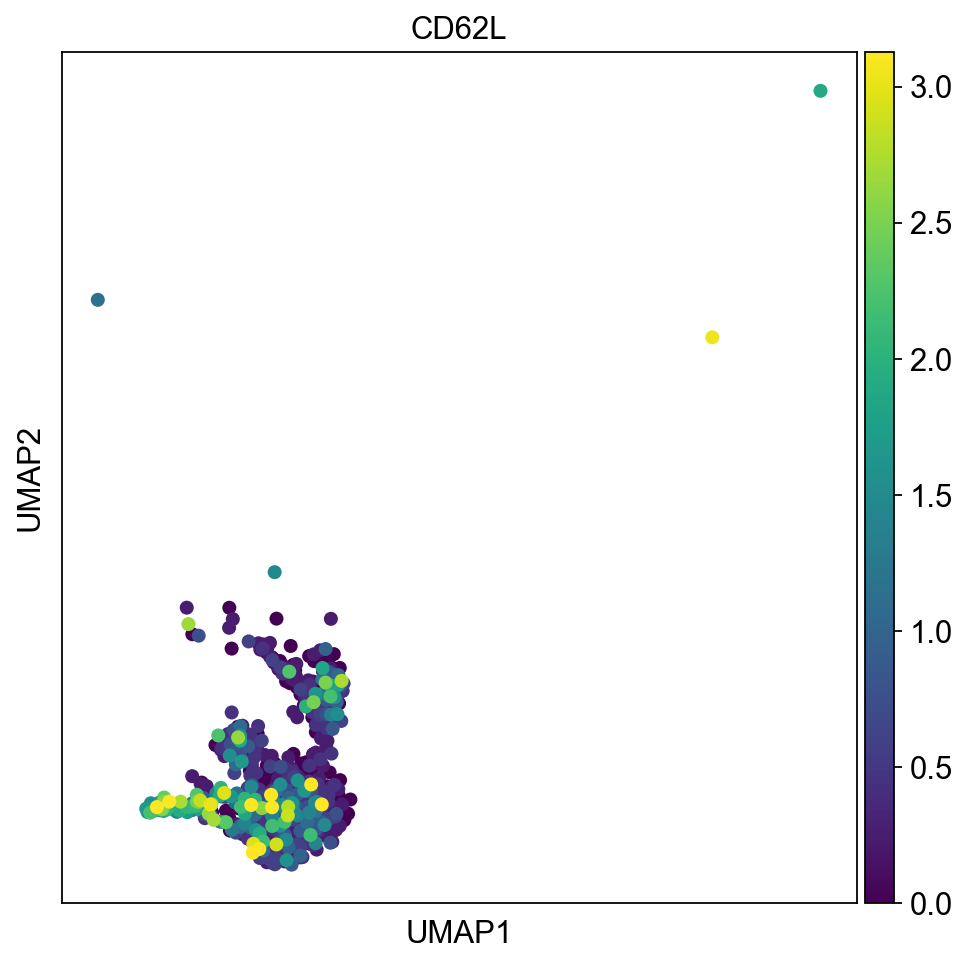

In [48]:
#Immature CD56bright NK cells

CD56brigh_yang= ['IL7R', 'SELL', 'KLRC1', 'GZMK']

CD56brigh_yang_prot = ['CD62L']


print("Immature CD56bright NK cell, RNA")
sc.pl.umap(sample_nk, color = CD56brigh_yang, vmax="p99", color_map = 'viridis', ncols=2)

print("Immature CD56bright NK cell, protein (SELL=CD62L)")
sc.pl.umap(sample_nk, color = CD56brigh_yang_prot, vmax="p99", color_map = 'viridis', ncols=2)



## Other testing

In [49]:
gammadelta_sep = ['TRG-AS1', 'TRGC1', 'TRGC2', 'TRGV10', 'TRGV2', 'TRGV3', 'TRGV4', 'TRGV5', 'TRGV7', 'TRGV9']

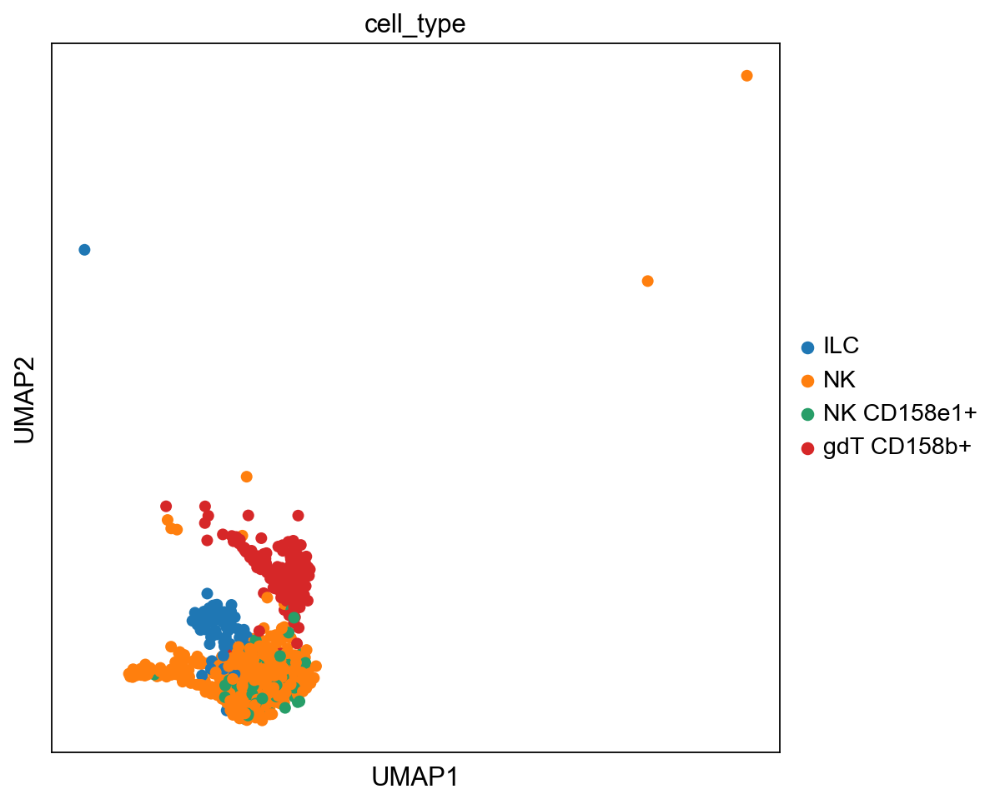

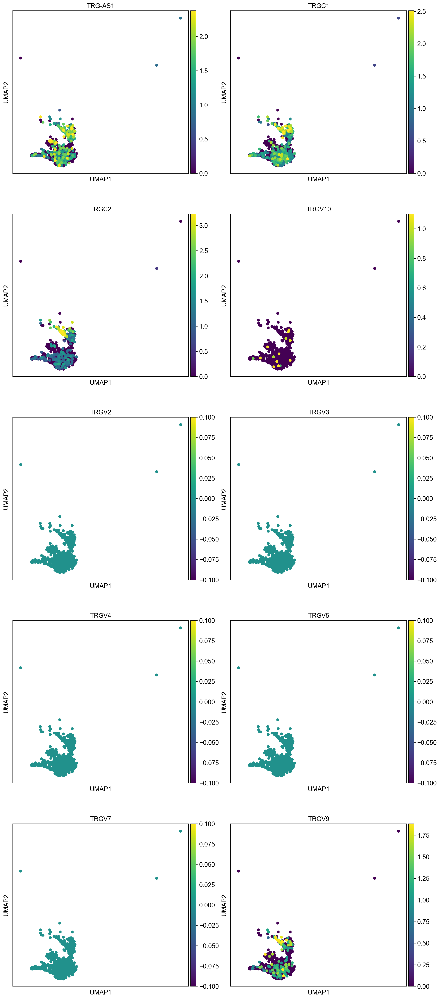

In [50]:
#separation from gamma delta T cells

gammadelta_sep = ['TRG-AS1', 'TRGC1', 'TRGC2', 'TRGV10', 'TRGV2', 'TRGV3', 'TRGV4', 'TRGV5', 'TRGV7', 'TRGV9']

sc.pl.umap(sample_nk, color = ['cell_type'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(sample_nk, color = gammadelta_sep, vmax="p99", color_map = 'viridis', ncols=2)

In [51]:
#CLR normalized protein data, Neurips only

adata = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/healthy_malig_outer_!m.h5ad')

In [ ]:
#Checking if gene was measured in particular study

adata[adata.to_df()['B3GAT1'] != 0].obs.BATCH.unique().tolist()

In [ ]:
result = [i for i in adata_neurips.var_names if i.startswith('KIR')]
print(result)

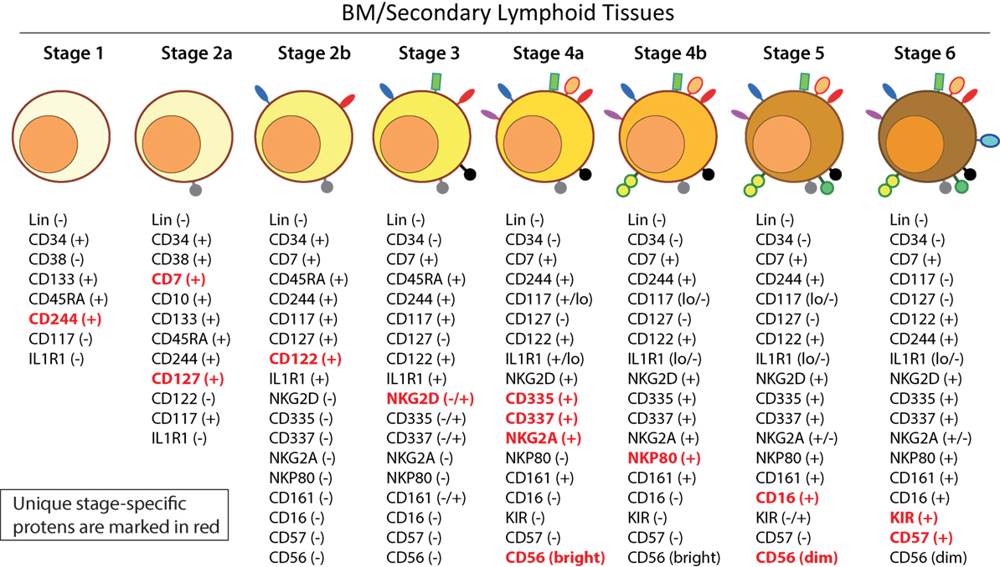

In [26]:
#NKG2A = KLRC1

stage1=["CD224_prot"]
stage2a= ['CD7', 'CD127']
stage2b= ['CD122']
stage3= ["CD314"]
stage4a= ['CD335',"CD56"]
#Stage4b = NKP80 marker not included
stage5= ['CD16']
stage6 = ['CD158e1', 'CD57']


In [27]:
#Used to check which markers were measured


listOfmarkers= ["CD186"]


for x in listOfmarkers:
    if x in prot.columns:
        print("Yes")
        

In [28]:
#If needed, column names can be changes (if gene and prot name same)
prot=prot.rename(columns={'CD224': 'CD224_prot'})

stage 1


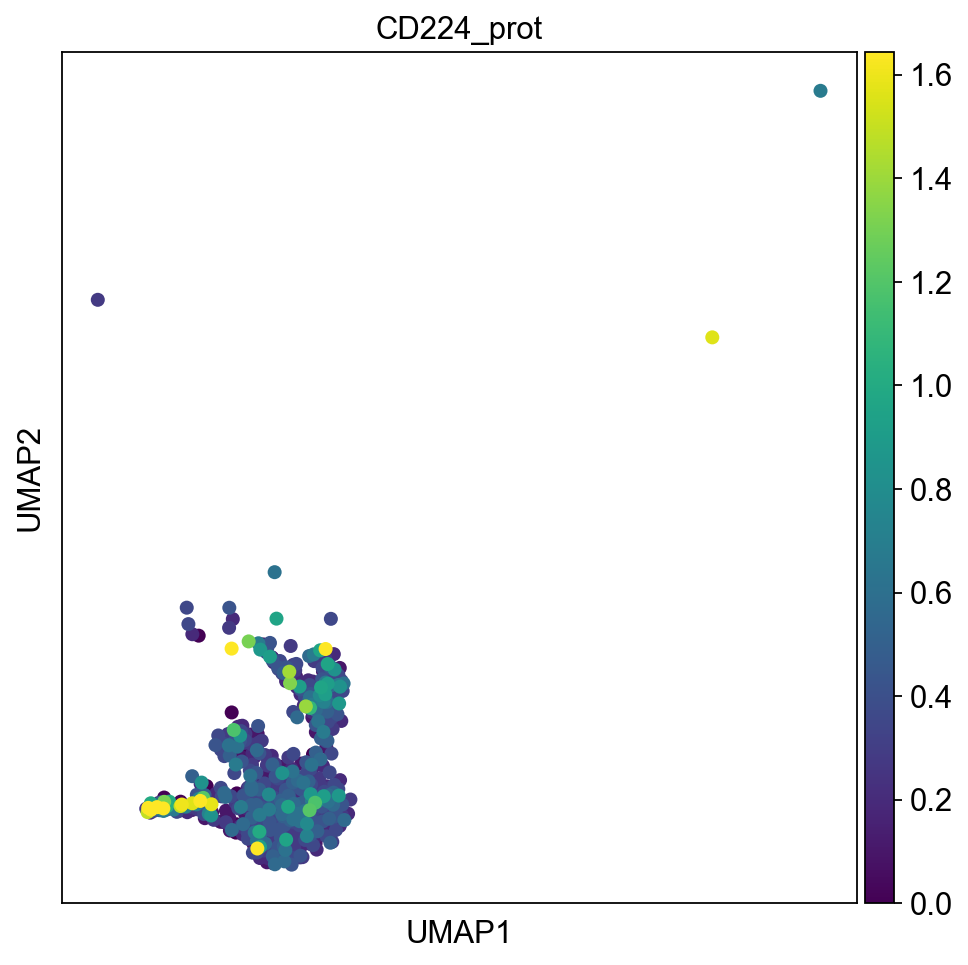

stage 2a


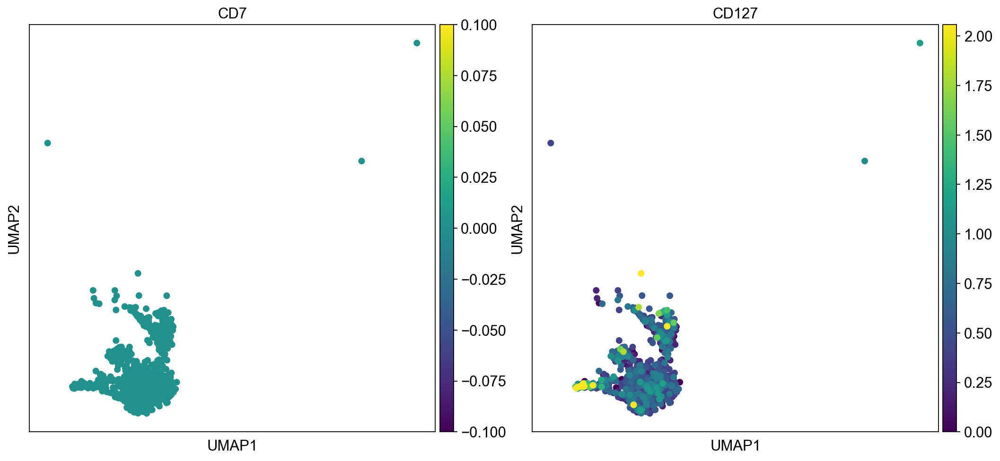

stage 2b


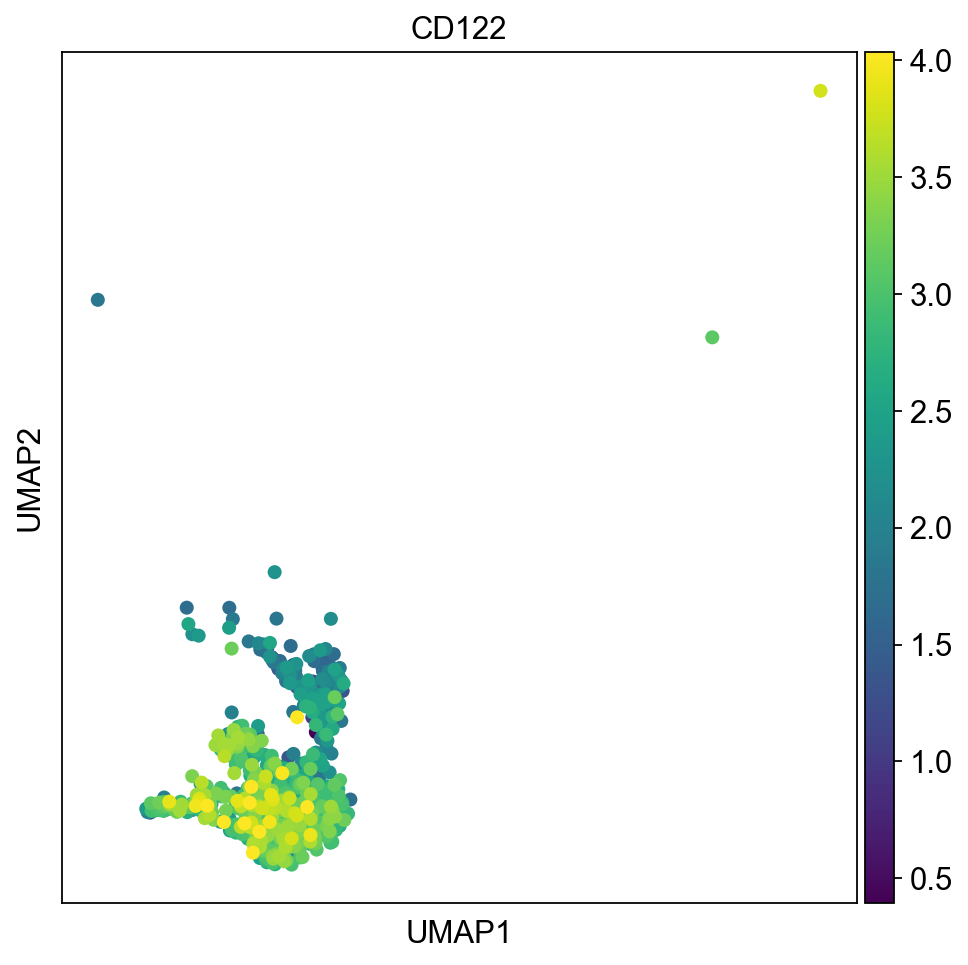

stage 3


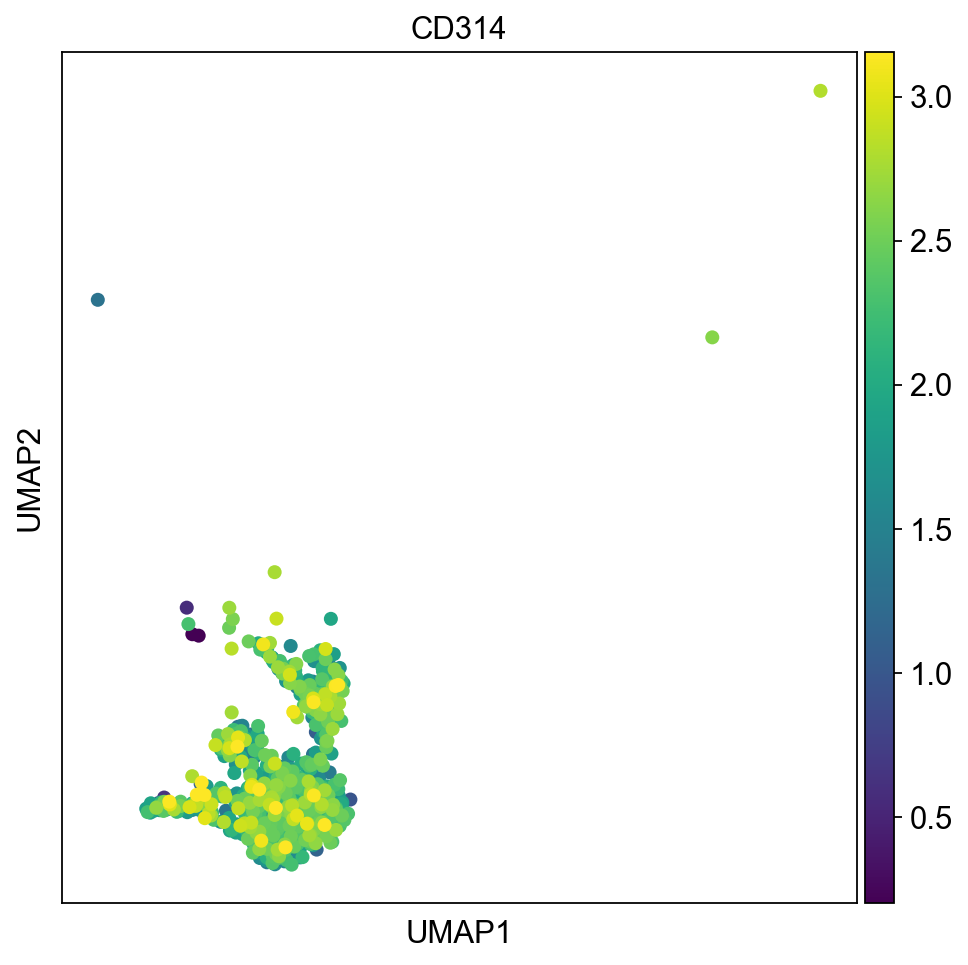

stage 4a, CD56bright


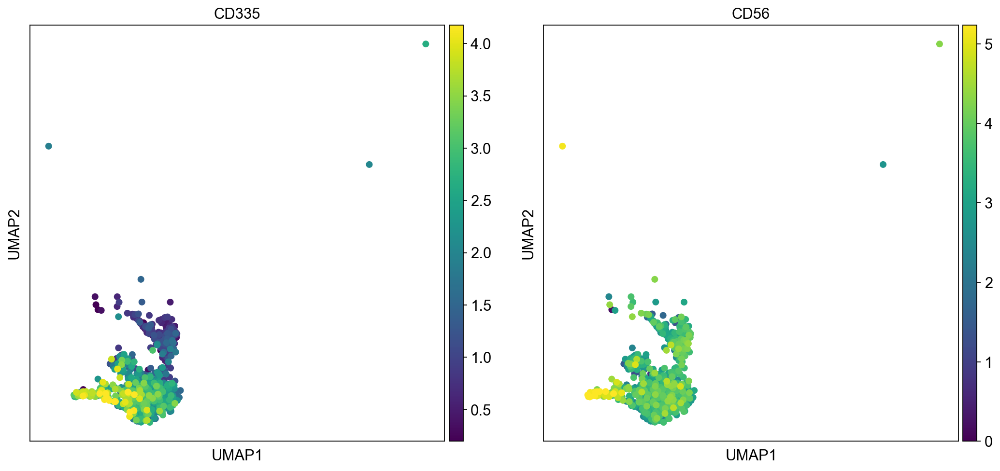

stage 5


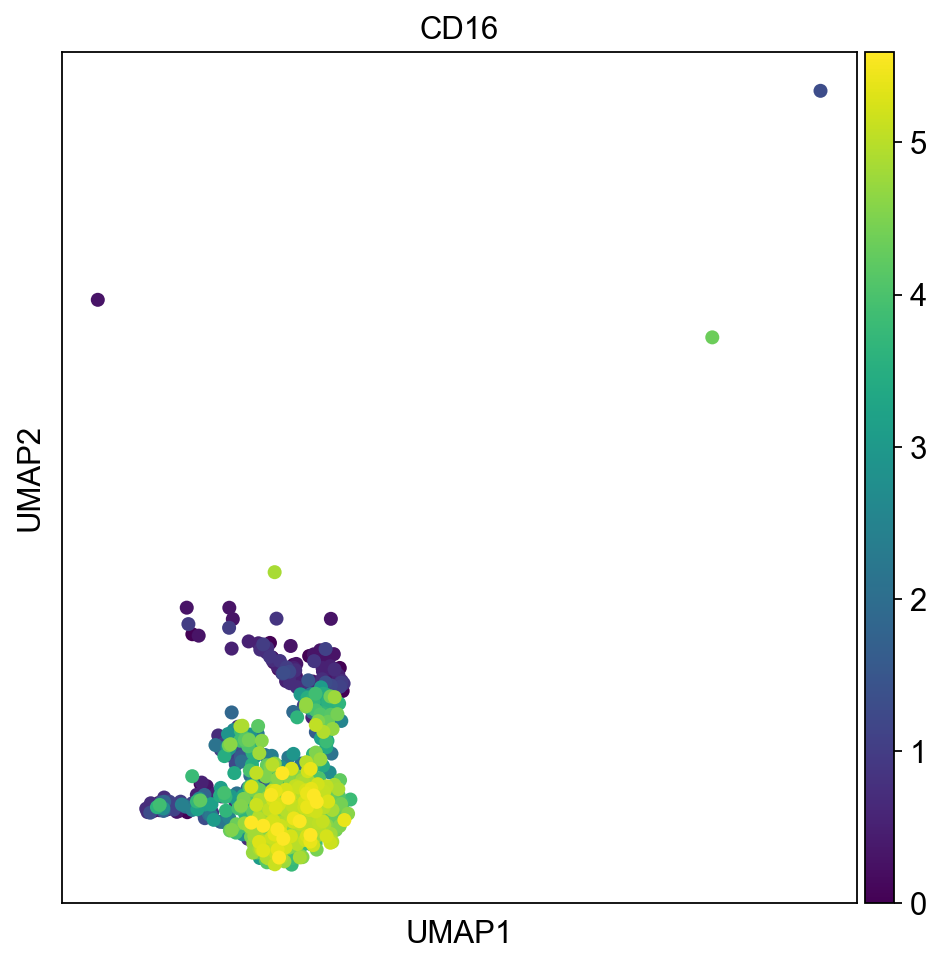

stage 6


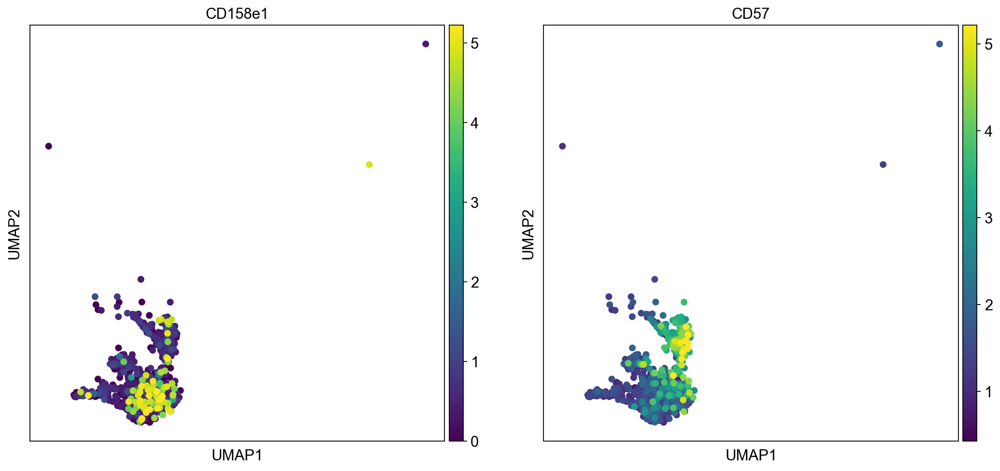

In [29]:
sc.set_figure_params(figsize=(7, 7))

#stage 1
print("stage 1")
sc.pl.umap(sample_nk, color = stage1, vmax="p99", color_map = 'viridis', ncols=2)

#stage 2a
print("stage 2a")
sc.pl.umap(sample_nk, color = stage2a, vmax="p99", color_map = 'viridis', ncols=2)

#stage 2b
print("stage 2b")
sc.pl.umap(sample_nk, color = stage2b, vmax="p99", color_map = 'viridis', ncols=2)

#stage 3
print("stage 3")
sc.pl.umap(sample_nk, color = stage3, vmax="p99", color_map = 'viridis', ncols=2)

#stage 4a
print("stage 4a, CD56bright")
sc.pl.umap(sample_nk, color = stage4a, vmax="p99", color_map = 'viridis', ncols=2)

#stage 5
print("stage 5")
sc.pl.umap(sample_nk, color = stage5, vmax="p99", color_map = 'viridis', ncols=2)

#stage 6
print("stage 6")
sc.pl.umap(sample_nk, color = stage6, vmax="p99", color_map = 'viridis', ncols=2)


